# 1. Giới thiệu Project 
**Coronavirus** là một họ vi-rút có thể gây bệnh, có thể khiến *cảm lạnh thông thường* và *ho* trở bệnh nặng hơn. **Hội chứng hô hấp Trung Đông (MERS-CoV)** và **Hội chứng hô hấp cấp tính nặng (SARS-CoV)** là những trường hợp nghiêm trọng mà thế giới phải đối mặt.<br> **SARS-CoV-2 (n-coronavirus)** SARS-CoV-2 (n-coronavirus) là loại virus mới thuộc họ coronavirus, *được phát hiện* lần đầu vào năm 2019, chưa được xác định ở người trước đây.

Nó là một loại vi-rút *truyền nhiễm* bắt đầu từ **Vũ Hán** vào **tháng 12 năm 2019**. Sau này, nó được **WHO** tuyên bố là **đại dịch** do tốc độ lây lan cao trên toàn thế giới. Hiện tại (ngày 10 tháng 6 năm 2020), đại dịch này đã khiến hơn *500 nghìn* người chết trên toàn cầu.<br>

Đại dịch đang lan rộng trên toàn thế giới; điều quan trọng bây giờ là hiểu rõ hơn về sự lây lan này. Notebook này đã nỗ lực phân tích dữ liệu tích lũy của các trường hợp đã xác nhận, trường hợp tử vong và hồi phục theo thời gian.
     <br>
   <font face = "Verdana" size ="1">
    <center><img src='https://www.statnews.com/wp-content/uploads/2020/02/Coronavirus-CDC-645x645.jpg'></center> 
    </font>
 <center><font face = "Verdana" size ="4"> Keep strong, world! Stay safe and healthy. </font><center>

<br>

# 2. Download và Cài đặt Prerequisite
**pycountry_convert**: Sử dụng dữ liệu quốc gia lấy từ wikipedia, thư viện này cung cấp các hàm chuyển đổi giữa tên quốc gia ISO, mã quốc gia và tên lục địa.

**folium, seaborn, plotly**: Một số thư viện trực quan hóa trong Python.

Bỏ chú thích và cài đặt một số thư viện nếu bạn chưa cài đặt chúng. Nếu không, hãy tiếp tục.

In [1]:
#!pip install pycountry_convert 
#!pip install folium
#!pip install seaborn
#!pip install plotly

In [1]:
#Import thư viện
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker 
import pycountry_convert as pc
from pycountry_convert import country_mappings as cm
import folium
from datetime import datetime, timedelta,date
from scipy.interpolate import make_interp_spline, BSpline
import plotly.express as px
import plotly.graph_objs as go
import json
import plotly.offline as py
import seaborn as sns
plt.style.use('fivethirtyeight')

# 3. Download tập dữ liệu

Tập dữ liệu này được cập nhật hàng ngày bởi Johns Hopkins CSSE. Tuy nhiên trong Asm này, học viên chỉ cần xử lý từ ngày đầu đến ngày 8/4/2021.

In [2]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

In [3]:
# Dữ liệu toàn cầu
confirmed_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
recoveries_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')

In [4]:
# Nhận code bạn tại đây để confirmed_df chỉ chưa dữ liệu đến ngày 8/4/2021
confirmed_df = confirmed_df.loc[:,:'8/4/21'] 

confirmed_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,7/26/21,7/27/21,7/28/21,7/29/21,7/30/21,7/31/21,8/1/21,8/2/21,8/3/21,8/4/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,144285,145008,145552,145996,146523,147154,147501,147985,148572,148933
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,132891,132922,132952,132999,133036,133081,133121,133146,133211,133310
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,163660,165204,167131,168668,170189,171392,172564,173922,175229,176724
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,14577,14586,14586,14655,14678,14678,14678,14747,14766,14797
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,41879,42110,42288,42486,42646,42777,42815,42970,43070,43158


In [5]:
# Nhận code bạn tại đây để deaths_df chỉ chưa dữ liệu đến ngày 8/4/2021
deaths_df = deaths_df.loc[:,:'8/4/21']

deaths_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,7/26/21,7/27/21,7/28/21,7/29/21,7/30/21,7/31/21,8/1/21,8/2/21,8/3/21,8/4/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,6477,6515,6577,6615,6677,6708,6737,6774,6804,6836
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,2456,2456,2457,2457,2457,2457,2457,2457,2457,2457
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,4087,4112,4161,4189,4219,4254,4291,4329,4370,4404
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,127,127,127,127,128,128,128,128,128,128
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,991,994,1000,1003,1008,1011,1016,1018,1022,1026


In [6]:
# Nhận code bạn tại đây để recoveries_df chỉ chưa dữ liệu đến ngày 8/4/2021
recoveries_df = recoveries_df.loc[:,:'8/4/21']

recoveries_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,7/26/21,7/27/21,7/28/21,7/29/21,7/30/21,7/31/21,8/1/21,8/2/21,8/3/21,8/4/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,82586,82586,82586,82586,82586,82586,82586,82586,82586,82586
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,130152,130166,130174,130187,130205,130222,130243,130256,130291,130314
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,111322,112050,112900,113707,114531,115276,116009,116770,117557,118409
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,14077,14113,14113,14180,14210,14210,14210,14296,14348,14380
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,35686,35742,35964,36025,36708,37255,37397,38360,39389,39582


#  4. Tìm hiểu dữ liệu 


    Xác định ngày đầu tiên bộ dữ liệu bắt đầu lưu trữ số ca Covid của 3 bộ dữ liệu

In [9]:
# Nhập code ở đây:
dates_starts_confirmed = confirmed_df.columns.to_list()[4]
dates_starts_deaths = deaths_df.columns.to_list()[4]
dates_starts_recoveries = recoveries_df.columns.to_list()[4]
#type(dates_starts_confirmed, dates_starts_deaths, dates_starts_recoveries)

    Xác định ngày cuối cùng dữ liệu được cập nhật số ca Covid của 3 DataFrames

In [10]:
# Nhập code ở đây:
dates_end_confirmed = confirmed_df.columns.to_list()[-1]
dates_end_deaths = deaths_df.columns.to_list()[-1]
dates_end_recoveries = recoveries_df.columns.to_list()[-1]
dates_end_confirmed, dates_end_deaths, dates_end_recoveries

('8/4/21', '8/4/21', '8/4/21')

    Xác định có bao nhiêu quốc gia trong dữ liệu này

In [11]:
#Nhập code ở đây:
confirmed_df_country = confirmed_df['Country/Region'].count()
deaths_df_contry = deaths_df['Country/Region'].count()
recoveries_df_contry  = recoveries_df['Country/Region'].count()
confirmed_df_country, deaths_df_contry, recoveries_df_contry

(289, 289, 274)

In [12]:
# Nhập code ở đây:


    Tính tổng số ngày có trong 3 bộ dữ liệu
  



In [13]:
# Nhập code ở đây:
confirmed_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 289 entries, 0 to 288
Columns: 565 entries, Province/State to 8/4/21
dtypes: float64(2), int64(561), object(2)
memory usage: 1.2+ MB


    Quan sát xem có quốc gia nào bị trùng lặp trong 3 bộ dữ liệu hay không

In [14]:
# Nhập code ở đây (confirmed_df):
# Sử dụng method duplicated() để kiêm tra xem trong bộ dữ liệu confirmed_df có bị trùng lặp hay không.
duplicate_confirmed = confirmed_df[confirmed_df.duplicated('Country/Region')]
duplicate_confirmed

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,7/26/21,7/27/21,7/28/21,7/29/21,7/30/21,7/31/21,8/1/21,8/2/21,8/3/21,8/4/21
10,New South Wales,Australia,-33.868800,151.209300,0,0,0,0,3,4,...,8118,8294,8531,8703,8915,9153,9360,9562,9795,10063
11,Northern Territory,Australia,-12.463400,130.845600,0,0,0,0,0,0,...,192,192,197,197,197,199,200,200,198,198
12,Queensland,Australia,-27.469800,153.025100,0,0,0,0,0,0,...,1770,1790,1791,1793,1800,1809,1824,1840,1859,1886
13,South Australia,Australia,-34.928500,138.600700,0,0,0,0,0,0,...,856,857,859,859,859,859,862,863,866,866
14,Tasmania,Australia,-42.882100,147.327200,0,0,0,0,0,0,...,234,234,234,234,234,234,234,234,234,235
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
274,Montserrat,United Kingdom,16.742498,-62.187366,0,0,0,0,0,0,...,21,21,21,21,21,21,21,21,21,21
275,Pitcairn Islands,United Kingdom,-24.376800,-128.324200,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
276,"Saint Helena, Ascension and Tristan da Cunha",United Kingdom,-7.946700,-14.355900,0,0,0,0,0,0,...,4,4,4,4,4,4,4,4,4,4
277,Turks and Caicos Islands,United Kingdom,21.694000,-71.797900,0,0,0,0,0,0,...,2466,2466,2473,2479,2481,2484,2486,2486,2486,2486


In [15]:
# Nhập code ở đây (deaths_df):
# Sử dụng method duplicated() để kiêm tra xem trong bộ dữ liệu deaths_df có bị trùng lặp hay không.
duplicate_deaths = deaths_df[deaths_df.duplicated('Country/Region')]
duplicate_deaths

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,7/26/21,7/27/21,7/28/21,7/29/21,7/30/21,7/31/21,8/1/21,8/2/21,8/3/21,8/4/21
10,New South Wales,Australia,-33.868800,151.209300,0,0,0,0,0,0,...,66,65,67,67,68,68,69,69,71,76
11,Northern Territory,Australia,-12.463400,130.845600,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,Queensland,Australia,-27.469800,153.025100,0,0,0,0,0,0,...,7,7,7,7,7,7,7,7,7,7
13,South Australia,Australia,-34.928500,138.600700,0,0,0,0,0,0,...,4,4,4,4,4,4,4,4,4,4
14,Tasmania,Australia,-42.882100,147.327200,0,0,0,0,0,0,...,13,13,13,13,13,13,13,13,13,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
274,Montserrat,United Kingdom,16.742498,-62.187366,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
275,Pitcairn Islands,United Kingdom,-24.376800,-128.324200,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
276,"Saint Helena, Ascension and Tristan da Cunha",United Kingdom,-7.946700,-14.355900,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
277,Turks and Caicos Islands,United Kingdom,21.694000,-71.797900,0,0,0,0,0,0,...,18,18,18,18,18,18,18,18,18,18


In [16]:
# Nhập code ở đây (recoveries_df):
# Sử dụng method duplicated() để kiêm tra xem trong bộ dữ liệu recoveries_df có bị trùng lặp hay không.
duplicate_recoveries = recoveries_df[recoveries_df.duplicated('Country/Region')]
duplicate_recoveries

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,7/26/21,7/27/21,7/28/21,7/29/21,7/30/21,7/31/21,8/1/21,8/2/21,8/3/21,8/4/21
10,New South Wales,Australia,-33.868800,151.209300,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,Northern Territory,Australia,-12.463400,130.845600,0,0,0,0,0,0,...,189,190,190,190,191,191,191,191,193,193
12,Queensland,Australia,-27.469800,153.025100,0,0,0,0,0,0,...,1715,1717,1717,1720,1720,1725,1727,1727,1727,1727
13,South Australia,Australia,-34.928500,138.600700,0,0,0,0,0,0,...,826,827,827,829,829,830,830,831,835,841
14,Tasmania,Australia,-42.882100,147.327200,0,0,0,0,0,0,...,221,221,221,221,221,221,221,221,221,221
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,Montserrat,United Kingdom,16.742498,-62.187366,0,0,0,0,0,0,...,19,19,19,19,19,19,19,19,19,19
260,Pitcairn Islands,United Kingdom,-24.376800,-128.324200,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
261,"Saint Helena, Ascension and Tristan da Cunha",United Kingdom,-7.946700,-14.355900,0,0,0,0,0,0,...,4,4,4,4,4,4,4,4,4,4
262,Turks and Caicos Islands,United Kingdom,21.694000,-71.797900,0,0,0,0,0,0,...,2418,2425,2426,2431,2431,2431,2433,2433,2433,2433


    Xác định những quốc gia có trong 3 bộ dữ liệu được lưu trữ số ca Covid theo toàn quốc chứ không theo từng thành phố


In [17]:
# Nhập code ở đây (recoveries_df):
#Do recoveries có kiểu dữ liệt object nên sử dụng method .str.title() để lấy tiêu đề cột.
#Sau đó dùng unique() để lọc những tên cột duy nhất
recoveries_df['Country/Region'].str.title().unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antarctica', 'Antigua And Barbuda', 'Argentina', 'Armenia',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bhutan', 'Bolivia', 'Bosnia And Herzegovina', 'Botswana',
       'Brazil', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burma', 'Burundi',
       'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica',
       "Cote D'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark',
       'Diamond Princess', 'Djibouti', 'Dominica', 'Dominican Republic',
       'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea',
       'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France',
       'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece',
       'Grenada', 'Gua

    Xác định những quốc gia có trong 3 bộ dữ liệu được lưu trữ số ca Covid theo từng thành phố

In [18]:
# Nhập code ở đây (recoveries_df):


    Xác định quốc gia và ngày mà có số ca Covid nhiều nhất

In [19]:
# Nhập code ở đây:


    Xác định quốc gia có tổng số người mất do Covid là nhiều nhất

In [20]:
# Nhập code ở đây:


    Tính tổng số ca Covid, số ca tử vong, cố ca hồi phục và số ca còn Covid ở thời điểm hiện tại của Việt Nam


In [21]:
# Nhập code ở đây:


#  5. Phân tích toàn cầu

## Bài toán 1

    Tính số lượng tổng số trường hợp Covid, tổng số ca tử vong, tổng số ca phục hồi và số ca còn đang mắc Covid theo thời gian (đơn vị ngày).

In [22]:
cols = confirmed_df.keys()
confirmed = confirmed_df.loc[:, cols[4]:cols[-1]]
deaths = deaths_df.loc[:, cols[4]:cols[-1]]
recoveries = recoveries_df.loc[:, cols[4]:cols[-1]]
dates = confirmed.keys()

total_cases = []
total_deaths = [] 
mortality_rate = []
recovery_rate = [] 
total_recovered = [] 
total_active = [] 
dates = confirmed_df.columns.tolist()[4:]
adjusted_dates = list(np.array([i for i in range(len(dates))]).reshape(-1, 1)[:, 0])

#Nhập code ở đây:
#total case per day
total_confirmed_daily = confirmed_df.iloc[:,4:].sum()
total_deaths_daily = deaths_df.iloc[:,4:].sum()
total_recoveries_daily = recoveries_df.iloc[:,4:].sum()
total_active_daily = total_confirmed_daily - (total_deaths_daily + total_recoveries_daily)
#total_case 
total_cases = total_confirmed_daily.values
#total deaths
total_deaths = total_deaths_daily.values
#total recovered
total_recovered = total_recoveries_daily.values
#total active
total_active = total_cases - (total_deaths + total_recovered)

In [23]:
# Tống số trường hợp Covid, tổng số ca tử vong, tổng số ca phục hồi và số ca còn mắc Covid cho tới giờ.
print("Total confirmed cases: ", total_cases[-1])
print("Total death cases: ",total_deaths[-1])
print("Total recoveries cases: ",total_recovered[-1])
print("Total active cases: ",total_active[-1])

Total confirmed cases:  200756397
Total death cases:  4283069
Total recoveries cases:  130899061
Total active cases:  65574267


## Bài toán 2

    Hiển thị số lượng và log(10) của tổng số trường hợp Covid, tổng số ca tử vong, tổng số ca phục hồi và tổng số ca còn mắc covid theo thời gian (đơn vị ngày) trong 2 biểu đồ (một cho số lượng và một cho log(10)) bằng cách sử dụng biểu đồ đường.

In [24]:
#Nhập code ở đây:
# Create covid DataFrame
df_covid = pd.DataFrame(zip(total_cases, total_deaths, total_recovered, total_active), 
                        index=adjusted_dates, 
                        columns=['total_cases','total_deaths','total_recovered', 'total_active'])
# Calculte the log 10 of df_covid
df_covid_log10 = np.log10(df_covid)
df_covid

,total_cases,total_deaths,total_recovered,total_active
0,557,17,30,510
1,657,18,32,607
2,944,26,39,879
3,1437,42,42,1353
4,2120,56,56,2008
...,...,...,...,...
556,198389891,4246709,129705211,64437971
557,198875019,4254127,129994389,64626503
558,199441672,4262227,130277533,64901912
559,200075837,4272580,130582001,65221256


In [25]:
df_covid_log10

,total_cases,total_deaths,total_recovered,total_active
0,2.745855,1.230449,1.477121,2.707570
1,2.817565,1.255273,1.505150,2.783189
2,2.974972,1.414973,1.591065,2.943989
3,3.157457,1.623249,1.623249,3.131298
4,3.326336,1.748188,1.748188,3.302764
...,...,...,...,...
556,8.297520,6.628053,8.112957,7.809142
557,8.298580,6.628810,8.113925,7.810411
558,8.299816,6.629637,8.114870,7.812257
559,8.301195,6.630690,8.115883,7.814389


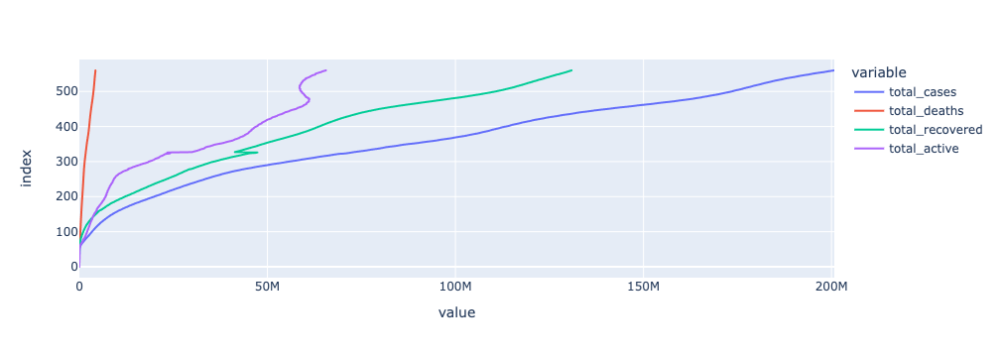

In [32]:
df = px.data.gapminder().query("continent == 'Oceania'")
fig = px.line(df_covid, x= df_covid.columns, y=df_covid.index)
fig.show()

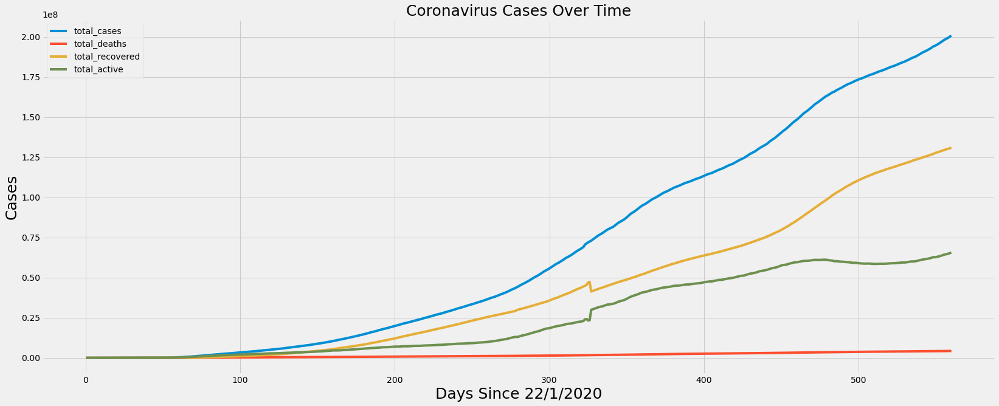

In [26]:
df_covid.plot(kind ='line',figsize =(25,10))
plt.xlabel('Days Since 22/1/2020', fontsize=25)
plt.ylabel('Cases',fontsize =25)
plt.title('Coronavirus Cases Over Time',fontsize =25)
plt.show()

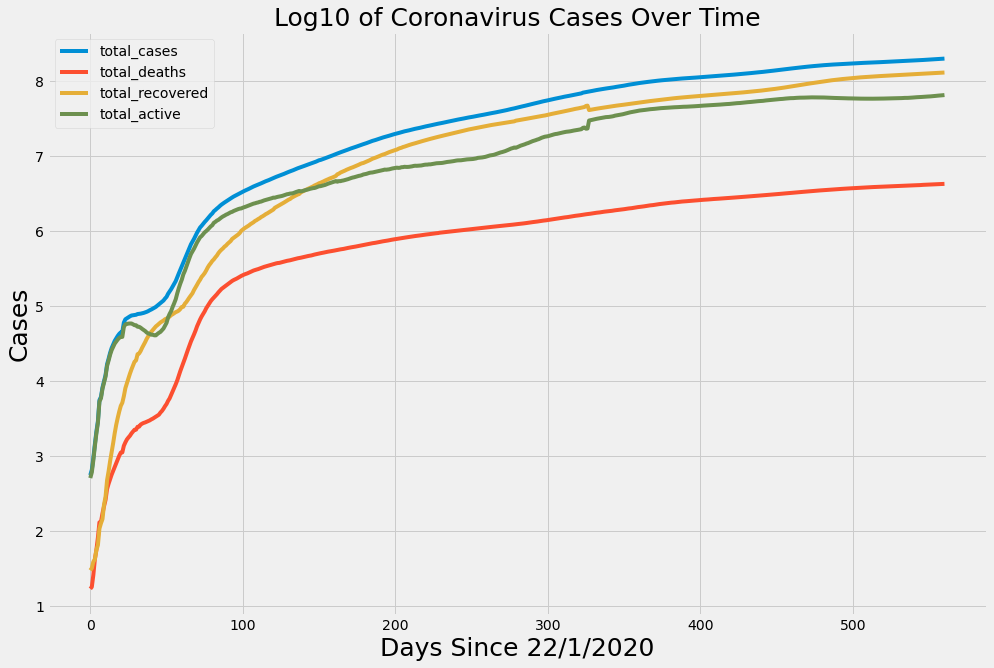

In [27]:
df_covid_log10.plot(kind ='line',figsize =(15,10))
plt.xlabel('Days Since 22/1/2020', fontsize=25)
plt.ylabel('Cases',fontsize =25)
plt.title('Log10 of Coronavirus Cases Over Time',fontsize =25)
plt.show()

## Bài toán 3
    Hiển thị tổng số trường hợp Covid, tổng số ca tử vong, tổng số ca phục hồi và tổng số ca còn mắc covid theo thời gian (đơn vị ngày) ở 4 biểu đồ riêng biệt bằng cách sử dụng biểu đồ đường.

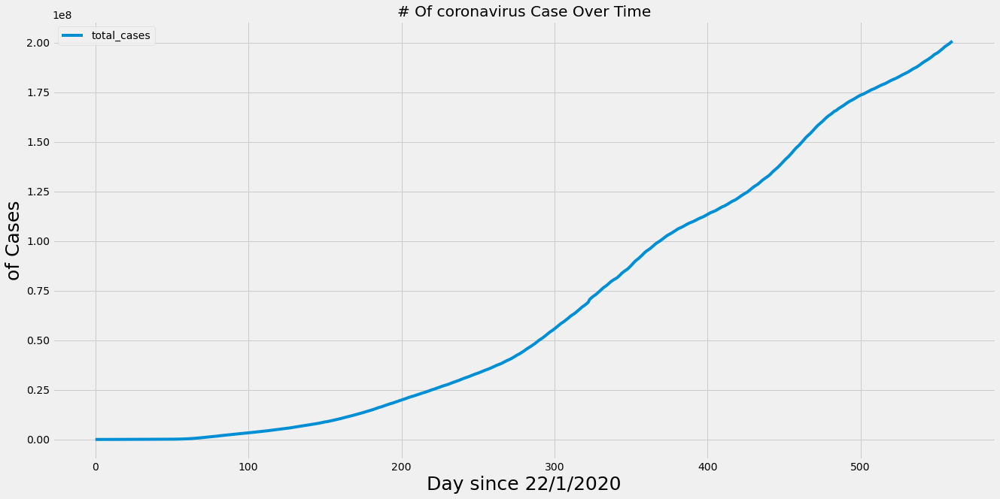

In [17]:
#Nhập code ở đây:
#display total_cases covid
df_total_cases = pd.DataFrame(total_cases,
                              index= adjusted_dates,
                              columns= ['total_cases'])
df_total_cases.plot(kind = 'line',figsize = (20,10))
plt.xlabel('Day since 22/1/2020',fontsize = 25)
plt.ylabel('of Cases',fontsize = 25)
plt.title('# Of coronavirus Case Over Time')
plt.show()

Text(0.5, 1.0, '# Of coronavirus Deaths Over Time')

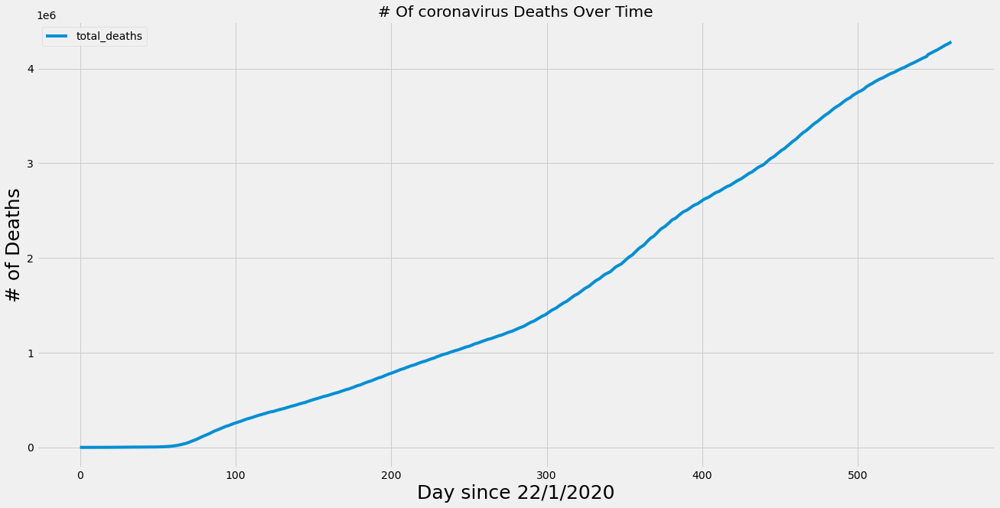

In [18]:
#display total_deaths covid
df_total_deaths = pd.DataFrame(total_deaths,
                               index = adjusted_dates,
                               columns= ['total_deaths'])
df_total_deaths.plot(kind = 'line',figsize = (20,10))
plt.xlabel('Day since 22/1/2020',fontsize = 25)
plt.ylabel('# of Deaths',fontsize = 25)
plt.title('# Of coronavirus Deaths Over Time')

Text(0.5, 1.0, '# Of coronavirus Recovered Over Time')

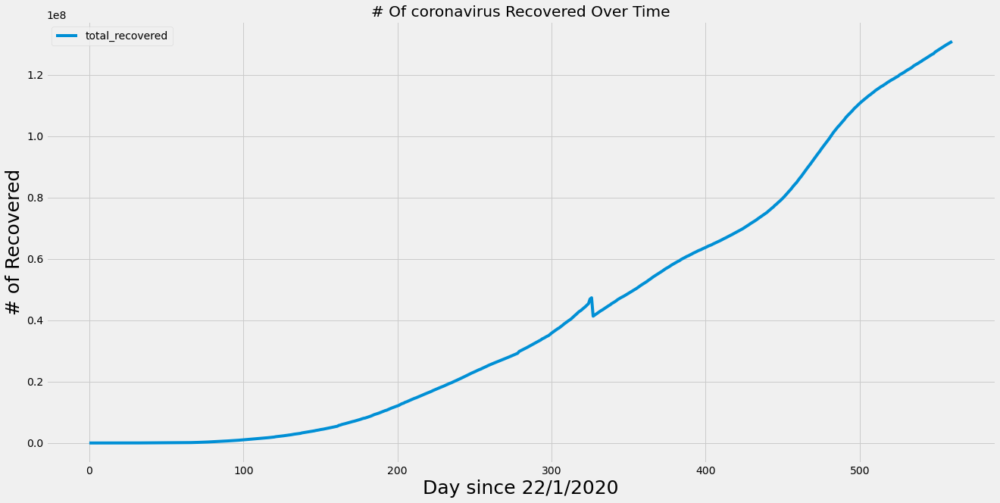

In [19]:
#display total_recovered covid
df_total_recovered = pd.DataFrame(total_recovered,
                                   index= adjusted_dates,
                                   columns= ['total_recovered'])
df_total_recovered.plot(kind = 'line',figsize = (20,10))
plt.xlabel('Day since 22/1/2020',fontsize = 25)
plt.ylabel('# of Recovered',fontsize = 25)
plt.title('# Of coronavirus Recovered Over Time')

Text(0.5, 1.0, '# Of coronavirus Active Over Time')

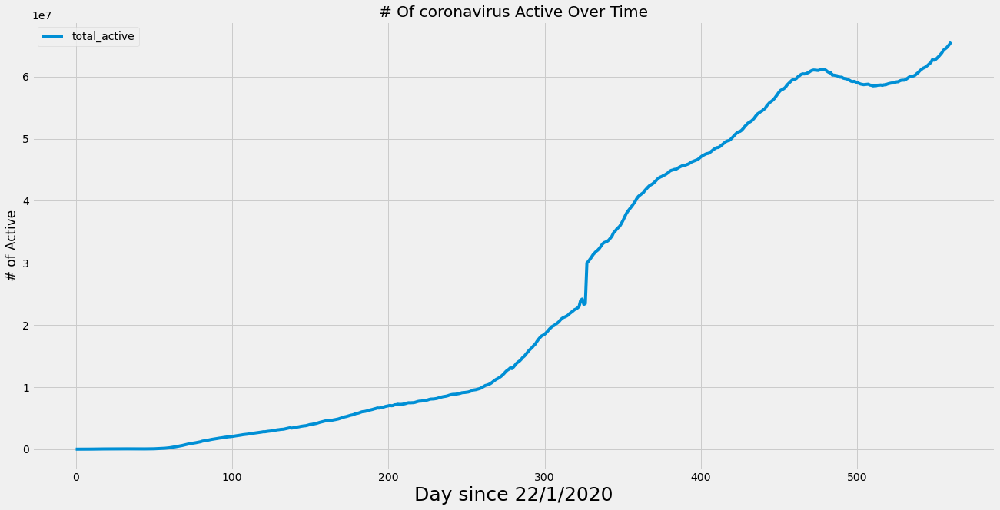

In [20]:
#display total_active covid
df_total_active = pd.DataFrame(total_active,
                               index= adjusted_dates,
                               columns= ['total_active'])
df_total_active.plot(kind = 'line',figsize = (20,10))
plt.xlabel('Day since 22/1/2020',fontsize = 25)
plt.ylabel('# of Active')
plt.title('# Of coronavirus Active Over Time')

## Bài toán 4
    Tính số lượng gia tăng hàng ngày về: tổng số ca mắc Covid, tổng số ca tử vong, tổng số ca phục hồi và tổng số ca còn mắc Covid theo thời gian (đơn vị ngày).

In [21]:
df_covid[0:1]

,total_cases,total_deaths,total_recovered,total_active
0,557,17,30,510


In [22]:
#Nhập code ở đây:
df_covid[:-1]

,total_cases,total_deaths,total_recovered,total_active
0,557,17,30,510
1,657,18,32,607
2,944,26,39,879
3,1437,42,42,1353
4,2120,56,56,2008
...,...,...,...,...
555,197875356,4237602,129401282,64236472
556,198394921,4246460,129705211,64443250
557,198880030,4253874,129994389,64631767
558,199446976,4261984,130277533,64907459


In [23]:
df_convid_increase_day = pd.concat([df_covid[0:1],df_covid[:-1]],axis = 0,ignore_index=True)
df_convid_increase_day

,total_cases,total_deaths,total_recovered,total_active
0,557,17,30,510
1,557,17,30,510
2,657,18,32,607
3,944,26,39,879
4,1437,42,42,1353
...,...,...,...,...
556,197875356,4237602,129401282,64236472
557,198394921,4246460,129705211,64443250
558,198880030,4253874,129994389,64631767
559,199446976,4261984,130277533,64907459


In [24]:
df_convid_increase_daily = df_covid - df_convid_increase_day
df_convid_increase_daily

,total_cases,total_deaths,total_recovered,total_active
0,0,0,0,0
1,100,1,2,97
2,287,8,7,272
3,493,16,3,474
4,683,14,14,655
...,...,...,...,...
556,519565,8858,303929,206778
557,485109,7414,289178,188517
558,566946,8110,283144,275692
559,634192,10355,304468,319369


## Bài toán 5
    Tính số lượng gia tăng hàng ngày về: tổng số ca mắc Covid, tổng số ca tử vong, tổng số ca phục hồi và tổng số ca còn mắc Covid theo thời gian (đơn vị ngày ở 4 biểu đồ riêng biệt).

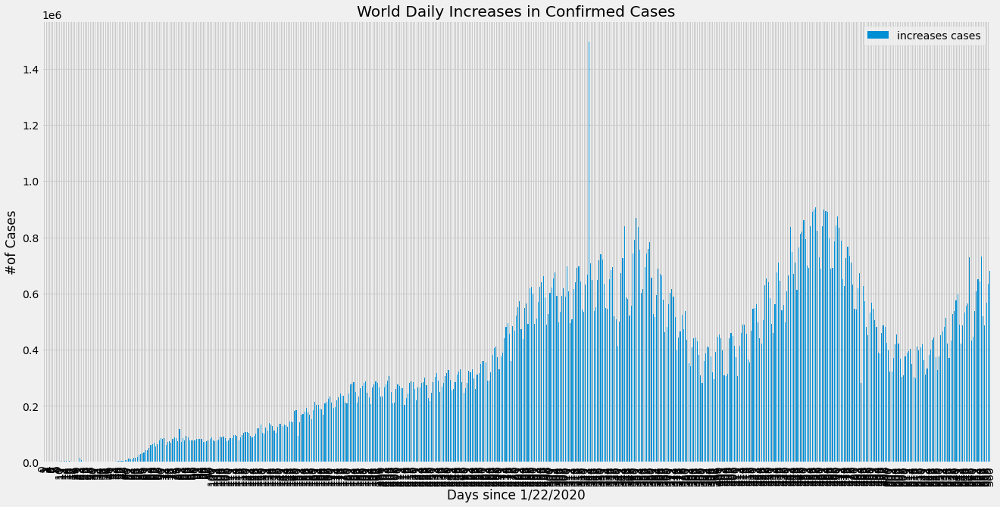

In [28]:
df_convid_increase_daily = df_convid_increase_daily['total_cases']
df_convid_increase_daily.plot(kind = 'bar', figsize =(20,10))
plt.xlabel('Days since 1/22/2020')
plt.ylabel('#of Cases')
plt.title('World Daily Increases in Confirmed Cases')
plt.legend(['increases cases'])
plt.show()

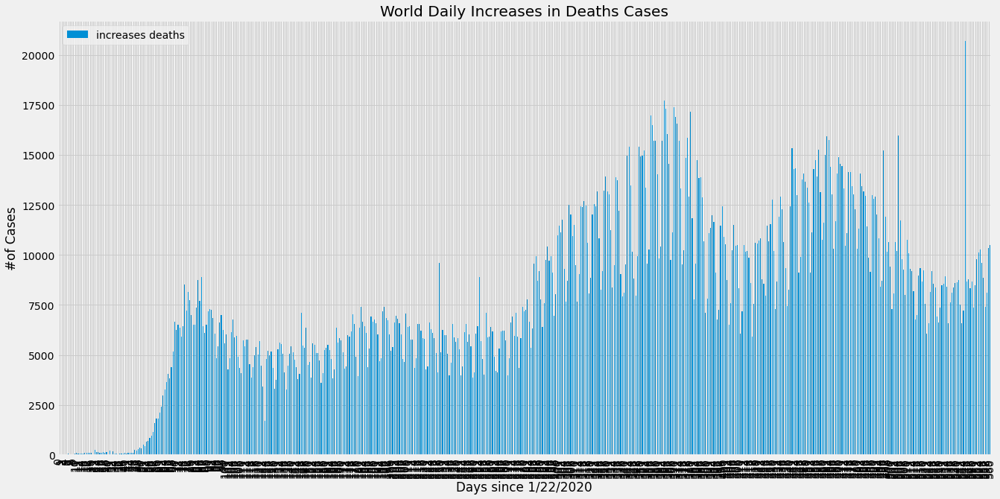

In [40]:
df_convid_increase_daily = df_convid_increase_daily['total_deaths']
df_convid_increase_daily.plot(kind = 'bar', figsize =(20,10))
plt.xlabel('Days since 1/22/2020')
plt.ylabel('#of Cases')
plt.title('World Daily Increases in Deaths Cases')
plt.legend(['increases deaths'])
plt.show()

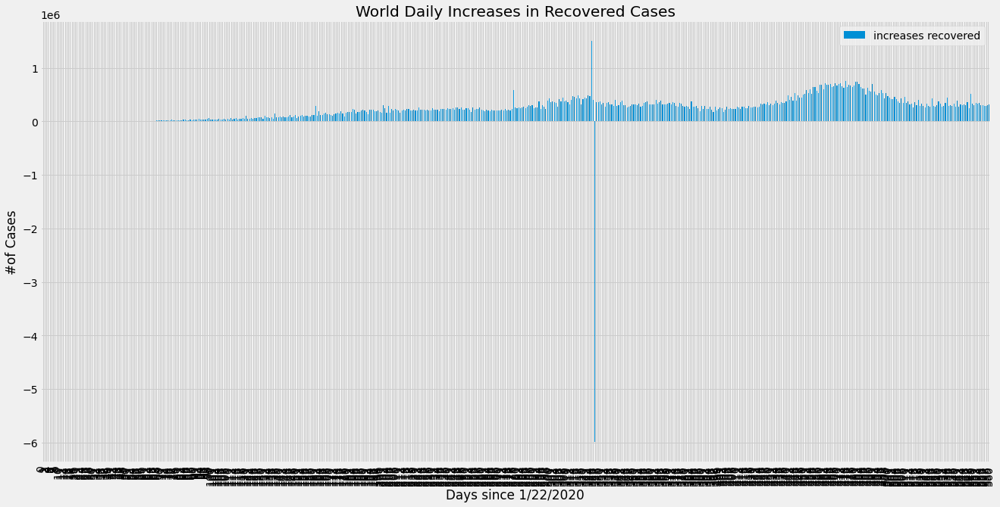

In [42]:
df_convid_increase_daily = df_convid_increase_daily['total_recovered']
df_convid_increase_daily.plot(kind = 'bar', figsize =(20,10))
plt.xlabel('Days since 1/22/2020')
plt.ylabel('#of Cases')
plt.title('World Daily Increases in Recovered Cases')
plt.legend(['increases recovered'])
plt.show()

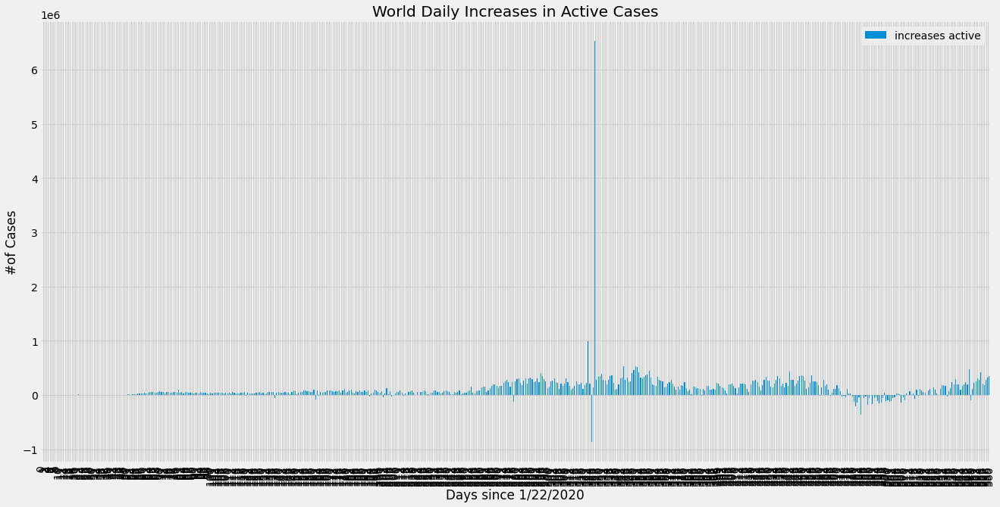

In [44]:
df_convid_increase_daily = df_convid_increase_daily['total_active']
df_convid_increase_daily.plot(kind = 'bar', figsize =(20,10))
plt.xlabel('Days since 1/22/2020')
plt.ylabel('#of Cases')
plt.title('World Daily Increases in Active Cases')
plt.legend(['increases active'])
plt.show()

## Bài toán 6
    Tính phần trăm tỷ lệ tử vong toàn cầu và tỷ lệ hồi phục theo thời gian.

In [25]:
#Nhập code ở đây:
global_mortality_rate = (df_covid['total_deaths'] / df_covid['total_cases']) * 100
print('Phần trăm tỷ lệ tử vong toàn cầu:')
global_mortality_rate

Phần trăm tỷ lệ tử vong toàn cầu:


0      3.052065
1      2.739726
2      2.754237
3      2.922756
4      2.641509
         ...   
556    2.140408
557    2.138915
558    2.136901
559    2.135303
560    2.133288
Length: 561, dtype: float64

In [26]:
recovery_rate_over_time = (df_covid['total_recovered'] / df_covid['total_cases']) * 100
print('Tỷ lệ hồi phục theo thời gian: ')
recovery_rate_over_time

Tỷ lệ hồi phục theo thời gian: 


0       5.385996
1       4.870624
2       4.131356
3       2.922756
4       2.641509
         ...    
556    65.377284
557    65.363219
558    65.319382
559    65.264514
560    65.201203
Length: 561, dtype: float64

In [27]:
# Create covid percentage df
df_covid_percentage = pd.DataFrame(zip(global_mortality_rate,recovery_rate_over_time), 
                                   index=adjusted_dates, 
                                   columns=['mortality_rate','recovered_rate'])
df_covid_percentage

,mortality_rate,recovered_rate
0,3.052065,5.385996
1,2.739726,4.870624
2,2.754237,4.131356
3,2.922756,2.922756
4,2.641509,2.641509
...,...,...
556,2.140408,65.377284
557,2.138915,65.363219
558,2.136901,65.319382
559,2.135303,65.264514


## Bài toán 7
**7.1** 

    Hiển thị tỷ lệ tử vong theo thời gian (đơn vị ngày) bằng biểu đồ đường.

    Sử dụng đường gạch ngang để hiển thị tỷ lệ tử vong trung bình theo thời gian.

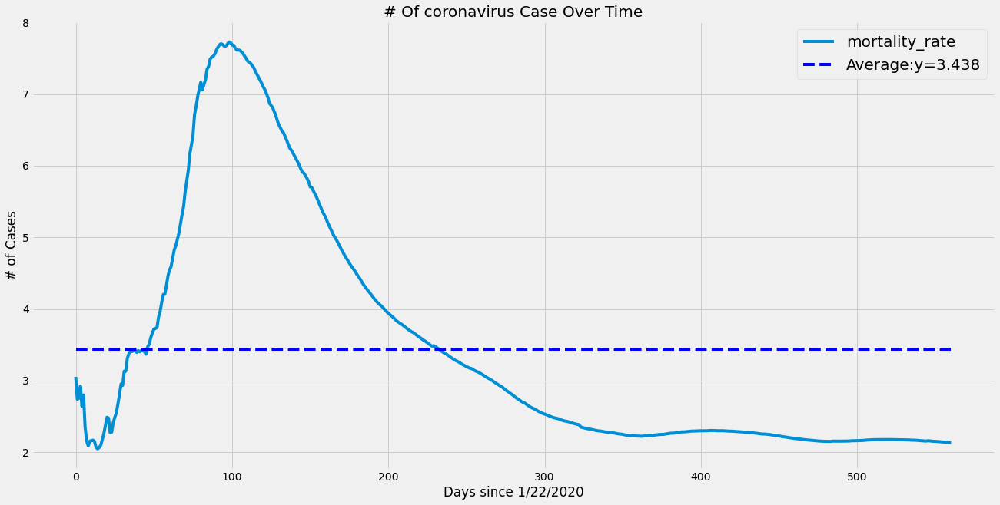

In [32]:
#Nhập code ở đây:
df_covid_percentage['mortality_rate'].plot(kind = 'line',figsize = (20,10))
plt.xlabel('Days since 1/22/2020')
plt.ylabel('# of Cases')
plt.title('# Of coronavirus Case Over Time')
#Tính tỷ lệ tử vong trung bình theo thời gian
avg_mortality_rate = round(df_covid_percentage['mortality_rate'].mean(),3)
avg_arr = [avg_mortality_rate for i in range(len(df_covid_percentage['mortality_rate']))]
#Sử dụng đường gạch ngang để hiển thị tỷ lệ tử vong trung bình
plt.plot(avg_arr, ls="--", color='blue', label=f"Average:y={avg_mortality_rate}")
plt.legend(fontsize=20)
plt.show()

**7.2** 

    Hiển thị tỷ lệ hồi phục theo thời gian (đơn vị ngày) bằng biểu đồ đường.

    Sử dụng đường gạch ngang để hiển thị tỷ lệ tử vong trung bình theo thời gian.

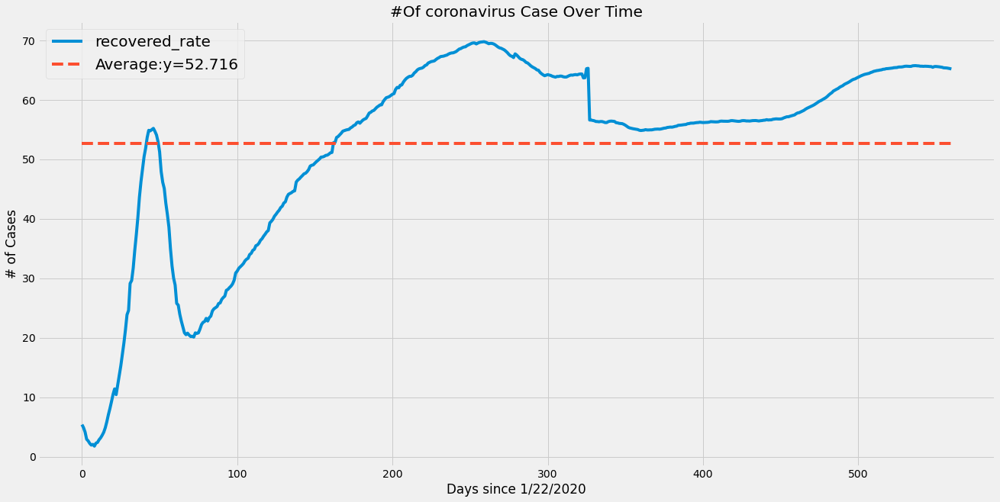

In [33]:
#Nhập code ở đây:
df_covid_percentage['recovered_rate'].plot(kind = 'line', figsize = (20,10))
plt.xlabel('Days since 1/22/2020')
plt.ylabel('# of Cases')
plt.title('#Of coronavirus Case Over Time')
#Tính tỷ lệ tử vong trung bình theo thời gian
avg_recovery_rate = round(df_covid_percentage['recovered_rate'].mean(),3)
avg_arr = [avg_recovery_rate for i in range(len(df_covid_percentage['recovered_rate']))]
#Sử dụng đường gạch ngang để hiển thị tỷ lệ tử vong trung bình theo thời gian
plt.plot(avg_arr,ls = '--',label=f"Average:y={avg_recovery_rate}")
plt.legend(fontsize=20)
plt.show()

#  6. Phân tích theo châu lục

## Tiền xử lý dữ liệu

In [28]:
# Thay đổi tên quốc gia theo yêu cầu của pycountry_convert Lib
confirmed_df.loc[confirmed_df['Country/Region'] == "US", "Country/Region"] = "USA"
deaths_df.loc[deaths_df['Country/Region'] == "US", "Country/Region"] = "USA"
recoveries_df.loc[recoveries_df['Country/Region'] == "US", "Country/Region"] = "USA"

confirmed_df.loc[confirmed_df['Country/Region'] == 'Korea, South', "Country/Region"] = 'South Korea'
deaths_df.loc[deaths_df['Country/Region'] == 'Korea, South', "Country/Region"] = 'South Korea'
recoveries_df.loc[recoveries_df['Country/Region'] == "Korea, South", "Country/Region"] = "South Korea"

confirmed_df.loc[confirmed_df['Country/Region'] == 'Taiwan*', "Country/Region"] = 'Taiwan'
deaths_df.loc[deaths_df['Country/Region'] == 'Taiwan*', "Country/Region"] = 'Taiwan'
recoveries_df.loc[recoveries_df['Country/Region'] == "Taiwan*", "Country/Region"] = "Taiwan"

confirmed_df.loc[confirmed_df['Country/Region'] == 'Congo (Kinshasa)', "Country/Region"] = 'Democratic Republic of the Congo'
deaths_df.loc[deaths_df['Country/Region'] == 'Congo (Kinshasa)', "Country/Region"] = 'Democratic Republic of the Congo'
recoveries_df.loc[recoveries_df['Country/Region'] == "Congo (Kinshasa)", "Country/Region"] = "Democratic Republic of the Congo"

confirmed_df.loc[confirmed_df['Country/Region'] == "Cote d'Ivoire", "Country/Region"] = "Côte d'Ivoire"
deaths_df.loc[deaths_df['Country/Region'] == "Cote d'Ivoire", "Country/Region"] = "Côte d'Ivoire"
recoveries_df.loc[recoveries_df['Country/Region'] == "Cote d'Ivoire", "Country/Region"] = "Côte d'Ivoire"

confirmed_df.loc[confirmed_df['Country/Region'] == "Reunion", "Country/Region"] = "Réunion"
deaths_df.loc[deaths_df['Country/Region'] == "Reunion", "Country/Region"] = "Réunion"
recoveries_df.loc[recoveries_df['Country/Region'] == "Reunion", "Country/Region"] = "Réunion"

confirmed_df.loc[confirmed_df['Country/Region'] == 'Congo (Brazzaville)', "Country/Region"] = 'Republic of the Congo'
deaths_df.loc[deaths_df['Country/Region'] == 'Congo (Brazzaville)', "Country/Region"] = 'Republic of the Congo'
recoveries_df.loc[recoveries_df['Country/Region'] == "Congo (Brazzaville)", "Country/Region"] = "Republic of the Congo"

confirmed_df.loc[confirmed_df['Country/Region'] == 'Bahamas, The', "Country/Region"] = 'Bahamas'
deaths_df.loc[deaths_df['Country/Region'] == 'Bahamas, The', "Country/Region"] = 'Bahamas'
recoveries_df.loc[recoveries_df['Country/Region'] == "Bahamas, The", "Country/Region"] = "Bahamas"

confirmed_df.loc[confirmed_df['Country/Region'] == 'Gambia, The', "Country/Region"] = 'Gambia'
deaths_df.loc[deaths_df['Country/Region'] == 'Gambia, The', "Country/Region"] = 'Gambia'
recoveries_df.loc[recoveries_df['Country/Region'] == "Gambia, The", "Country/Region"] = "Gambia"

# nhận tất cả các quốc gia
countries = np.asarray(confirmed_df["Country/Region"])
countries1 = np.asarray(deaths_df["Country/Region"])
countries2 = np.asarray(recoveries_df["Country/Region"])

# Continent_code thành Continent_names
continents = {
    'NA': 'North America',
    'SA': 'South America', 
    'AS': 'Asia',
    'OC': 'Australia',
    'AF': 'Africa',
    'EU' : 'Europe',
    'na' : 'Others'
}

# Định nghĩa hàm để nhận continent code cho quốc gia.
def country_to_continent_code(country):
    try:
        return pc.country_alpha2_to_continent_code(pc.country_name_to_country_alpha2(country))
    except :
        return 'na'


## Bài toán 8
    Thêm trường "continent" vào tập dữ liệu confirm_df, death_df và recorveries_df:

In [29]:
#1.confirm_df 
#Add continent into confirm_df
#setting each country to continent
list_conti_code = [country_to_continent_code(country) for country in confirmed_df['Country/Region']]
#get list continent name from list_conti_code
list_continent = [continents[conti_code] for conti_code in list_conti_code]
# Add continent column
confirmed_df['continent'] = list_continent

new_position_continent = ['Province/State','Country/Region','Lat','Long','continent'] + dates
confirmed_df = confirmed_df[new_position_continent]
#2.deaths_df
list_conti_death_code = [country_to_continent_code(country) for country in deaths_df['Country/Region']]
#get list continent name from list_conti_code
list_continent_deaths = [continents[conti_death_code] for conti_death_code in list_conti_death_code]
#Add continent column
deaths_df['continent'] = list_continent_deaths
deaths_df = deaths_df[new_position_continent]
#3.recovered_df
list_conti_reco_code  = [country_to_continent_code(country) for country in recoveries_df['Country/Region']]
#get list continent name from list_contu_code
list_continent_reco = [continents[conti_reco] for conti_reco in list_conti_reco_code]
#Add continent columns
recoveries_df['continent'] = list_continent_reco
recoveries_df = recoveries_df[new_position_continent]
deaths_df.head()

,Province/State,Country/Region,Lat,Long,continent,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,7/26/21,7/27/21,7/28/21,7/29/21,7/30/21,7/31/21,8/1/21,8/2/21,8/3/21,8/4/21
0,NaN,Afghanistan,33.93911,67.709953,Asia,0,0,0,0,0,...,6477,6515,6577,6615,6677,6708,6737,6774,6804,6836
1,NaN,Albania,41.15330,20.168300,Europe,0,0,0,0,0,...,2456,2456,2457,2457,2457,2457,2457,2457,2457,2457
2,NaN,Algeria,28.03390,1.659600,Africa,0,0,0,0,0,...,4087,4112,4161,4189,4219,4254,4291,4329,4370,4404
3,NaN,Andorra,42.50630,1.521800,Europe,0,0,0,0,0,...,127,127,127,127,128,128,128,128,128,128
4,NaN,Angola,-11.20270,17.873900,Africa,0,0,0,0,0,...,991,994,1000,1003,1008,1011,1016,1018,1022,1026


In [30]:
#1. set index for countries infor df
#continent: Country continent.
list_countries = confirmed_df.drop_duplicates(subset=['Country/Region'])
list_countries.set_index(['Country/Region'], inplace=True)
countries_info = list_countries[['Lat', 'Long','continent']]
countries_info 

,Lat,Long,continent
Country/Region,,,
Afghanistan,33.939110,67.709953,Asia
Albania,41.153300,20.168300,Europe
Algeria,28.033900,1.659600,Africa
Andorra,42.506300,1.521800,Europe
Angola,-11.202700,17.873900,Africa
...,...,...,...
West Bank and Gaza,31.952200,35.233200,Others
Winter Olympics 2022,39.904200,116.407400,Others
Yemen,15.552727,48.516388,Asia


## Bài toán 9
    Tạo data frame country_df với chỉ mục là trường "Country/Region".
    Các cột thông tin này gồm:
    - continent: Châu lục.
    - Confirmed: Tổng số ca mắc.
    - Deaths: Tổng số ca tử vong.
    - Recoveries: Tổng số ca hồi phục.
    - Active: Tổng số ca còn mắc Covid.
    - Mortality Rate: Tỷ lệ tử vong tính theo phần trăm.

In [32]:
#Nhập code ở đây:
#confirmed_df
#deaths_df
#recoveries_df
#df_mortality_rate
#df_total_active_increase_daily

#2. Create confirmed cases by country df
list_confirmed = confirmed_df.groupby(['Country/Region']).sum()
countries_confirmed = list_confirmed.iloc[:,-1]

#3.Create deaths case by country df 
list_deaths =deaths_df.groupby(['Country/Region']).sum()
countries_deaths =list_deaths.iloc[:,-1]

#4.Create recoveries case by country df
list_recoveries =recoveries_df.groupby(['Country/Region']).sum()
countries_recoveries = list_recoveries.iloc[:,-1]

# Naming all column above
countries_confirmed.name = 'Confirmed'
countries_deaths.name = 'Deaths'
countries_recoveries.name = 'Recoveries'

# Create requirement table
countries_df = pd.concat([countries_info, countries_confirmed, countries_deaths, countries_recoveries], axis=1) 
#5.Create df_total_active_incease_daily
countries_df['Active'] = countries_df['Confirmed'] - (countries_df['Recoveries']+countries_df['Deaths'])
countries_df
#6.Create mortality rate by country df 
countries_df['motality_rate'] = round(countries_df['Deaths']*100/countries_df['Confirmed'],2)
# Check error value 
countries_df[countries_df['Active'] < 0]                  # Active column contain 2 negative value
#there are 3 countries with wrong data are: Austria,Guyana,Peru. Drop them! 
countries_df.drop(['Guyana', 'Peru','Austria'], inplace=True)       # Drop Three countries have an Error data
 
# Check missing data
countries_df.isna().sum()                    # Mortality Rate column contain 1 missing value
countries_df.dropna(inplace=True)            # Drop nan rows
countries_df

,Lat,Long,continent,Confirmed,Deaths,Recoveries,Active,motality_rate
Country/Region,,,,,,,,
Afghanistan,33.939110,67.709953,Asia,148933,6836,82586,59511,4.59
Albania,41.153300,20.168300,Europe,133310,2457,130314,539,1.84
Algeria,28.033900,1.659600,Africa,176724,4404,118409,53911,2.49
Andorra,42.506300,1.521800,Europe,14797,128,14380,289,0.87
Angola,-11.202700,17.873900,Africa,43158,1026,39582,2550,2.38
...,...,...,...,...,...,...,...,...
Vietnam,14.058324,108.277199,Asia,181756,2327,54332,125097,1.28
West Bank and Gaza,31.952200,35.233200,Others,317404,3609,312320,1475,1.14
Yemen,15.552727,48.516388,Asia,7096,1380,4251,1465,19.45


## Bài toán 10
    Tạo data frame continents_df với chỉ mục là trường "continent".
    Các cột thông tin này gồm: 
    - Confirmed: Tổng số ca mắc.
    - Deaths: Tổng số ca tử vong.
    - Recoveries: Tổng số ca hồi phục.
    - Active: Tổng số ca còn mắc Covid.
    - Mortality Rate: Tỷ lệ tử vong tính theo phần trăm.

In [33]:
#Nhập code ở đây:
#groupby dataframe by continent
continent_confirmed = confirmed_df.groupby('continent').sum()
continent_deaths = deaths_df.groupby('continent').sum()
continent_recoveries = recoveries_df.groupby('continent').sum()
#continent_active = continent_confirmed -(continent_deaths + continent_recoveries)
#continent_mortality_rate = continent_deaths*100/continent_confirmed

# Sum total confirmed, total deaths, total recoveries by continent in the latest day 
df_confirmed = continent_confirmed.iloc[:,-1]
df_deaths = continent_deaths.iloc[:,-1]
df_recoveries = continent_recoveries.iloc[:,-1]
df_active  = df_confirmed -(df_deaths + df_recoveries)
continent_mortality_rate = round(df_deaths*100/df_confirmed,2)

# Naming three Series above
df_confirmed.name = 'Confirmed'
df_deaths.name = 'Deaths'
df_recoveries.name = 'Recoveries'
df_active.name ='Active'
continent_mortality_rate.name = 'Mortality Rate'
# Create continents dataframe
continents_df = pd.concat([df_confirmed, df_deaths, df_recoveries,df_active,continent_mortality_rate], axis=1) 
continents_df

,Confirmed,Deaths,Recoveries,Active,Mortality Rate
continent,,,,,
Africa,6855602,174000,5955131,726471,2.54
Asia,62536726,902751,57853343,3780632,1.44
Australia,90000,1425,55290,33285,1.58
Europe,52448545,1167092,27947075,23334378,2.23
North America,42355102,924576,5776939,35653587,2.18
Others,753558,16614,654615,82329,2.20
South America,35722194,1096367,32656668,1969159,3.07


## Mẫu biểu đồ đường
Dưới đây là các hàm mẫu để trực quan hóa các trường hợp mắc Covid theo thời gian ở mỗi lục địa/quốc gia:

In [34]:
def plot_params(ax,axis_label= None, plt_title = None,label_size=15, axis_fsize = 15, title_fsize = 20, scale = 'linear' ):
    # Tick-Parameters
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.tick_params(which='both', width=1,labelsize=label_size)
    ax.tick_params(which='major', length=6)
    ax.tick_params(which='minor', length=3, color='0.8')
    
    # Grid
    plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
    plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

    # Vẽ Title
    plt.title( plt_title,{'fontsize':title_fsize})
    
    # Trục y
    plt.yscale(scale)
    plt.minorticks_on()
    # Vẽ các nhãn theo trục
    xl = plt.xlabel(axis_label[0],fontsize = axis_fsize)
    yl = plt.ylabel(axis_label[1],fontsize = axis_fsize)
    
def visualize_covid_cases_5(confirmed, deaths,
                          continent=None , country = None , state = None, period = None, figure = None,
                          scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    ax.set_axisbelow(True)
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    color = ["blue","red","green"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else:
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)
        plt.fill_between(date,cases,color=color[i],alpha=0.3)
    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stats[0][params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stats[1][params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        
    text = stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 5 Days:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-6])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-6])+"\n"
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    
    # Vẽ các nhãn trục
    axis_label = ["Days ("+confirmed_df.columns[5]+" - "+confirmed_df.columns[-1]+")","No of Cases"]
    
    # Vẽ các tham số
    plot_params(ax,axis_label,scale = scale)
    
    # Vẽ Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19: "+params[1] ,{'fontsize':25})
        
    # Vị trí Legend 
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()
        
def visualize_covid_cases_7(confirmed, deaths, recoveries,
                          continent=None , country = None , state = None, period = None, figure = None,
                          scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    ax.set_axisbelow(True)
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths, recoveries]
    label = ["Confirmed", "Deaths", "Recoveries"]
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    color = ["blue","red","green"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else:
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)
        plt.fill_between(date,cases,color=color[i],alpha=0.3)
    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
        Total_recoveries = np.sum(np.asarray(stats[2].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stats[0][params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stats[1][params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_recoveries = np.sum(np.asarray(stats[2][stats[2][params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        
    text = stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 7 Days:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-8])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-8])+"\n"
    text += "Recoveries : " + str(Total_recoveries[-1] - Total_recoveries[-8])+"\n"
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    text += "Recoveries : " + str(Total_recoveries[-1] - Total_recoveries[-2])+"\n"
    
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    
    # Vẽ nhãn trục
    axis_label = ["Days ("+confirmed_df.columns[5]+" - "+confirmed_df.columns[-1]+")","No of Cases"]
    
    # Vẽ tham số
    plot_params(ax,axis_label,scale = scale)
    
    # Vẽ Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19: "+params[1] ,{'fontsize':25})
        
    # Vị trí Legend
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()        


## Bài toán 11
**11.1** 

    Áp dụng hàm visual_covid_case để hiển thị trực quan hóa của 7 lục địa trong 7 biểu đồ đường riêng biệt. Thứ tự của các trực quan hóa được sắp xếp theo thứ tự giảm dần theo số ca mắc được xác nhận. 
    

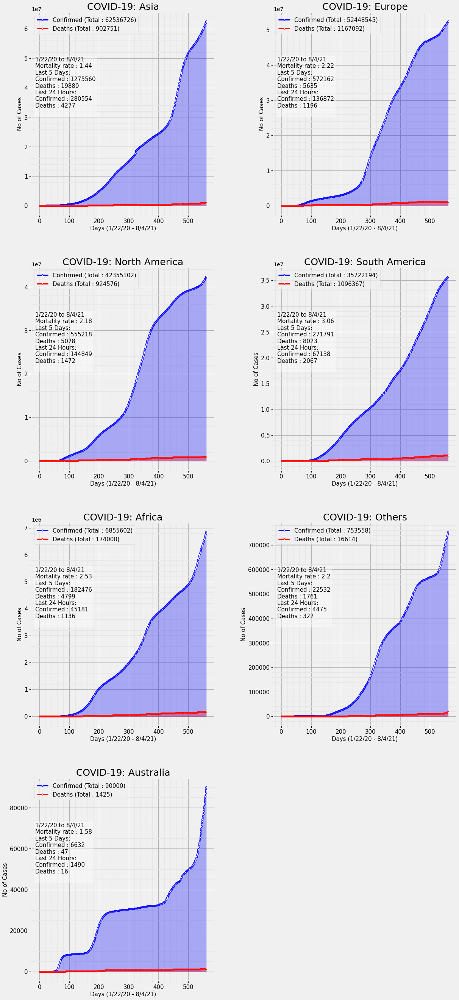

In [35]:
#Nhập code ở đây:
# Create 7 subplots
figure = plt.figure(figsize = (20,40))

fig1=[figure, 4, 2, 1]
fig2=[figure, 4, 2, 2]
fig3=[figure, 4, 2, 3]
fig4=[figure, 4, 2, 4]
fig5=[figure, 4, 2, 5]
fig6=[figure, 4, 2, 6]
fig7=[figure, 4, 2, 7]

visualize_covid_cases_5(confirmed_df, deaths_df,
                          continents['AS'] , country = None , state = None, period = None, figure =fig1,
                          scale = "linear")
visualize_covid_cases_5(confirmed_df, deaths_df,
                          continents['EU'] , country = None , state = None, period = None, figure =fig2,
                          scale = "linear")
visualize_covid_cases_5(confirmed_df, deaths_df,
                          continents['NA'] , country = None , state = None, period = None, figure =fig3,
                          scale = "linear")
visualize_covid_cases_5(confirmed_df, deaths_df,
                          continents['SA'] , country = None , state = None, period = None, figure =fig4,
                          scale = "linear")
visualize_covid_cases_5(confirmed_df, deaths_df,
                          continents['AF'] , country = None , state = None, period = None, figure =fig5,
                          scale = "linear")
visualize_covid_cases_5(confirmed_df, deaths_df,
                          continents['na'] , country = None , state = None, period = None, figure =fig6,
                          scale = "linear")
visualize_covid_cases_5(confirmed_df, deaths_df,
                          continents['OC'] , country = None , state = None, period = None, figure =fig7,
                          scale = "linear")


**11.2**

    Sửa đổi hàm "plot_params" và "visual_covid_case" thành:
    - Hiển thị kết quả của 7 ngày gần nhất thay vì 5 ngày.
    - Thêm "Recoveries line" vào biểu đồ chính.
    - Thêm số "Total Recoveries" vào bảng nhỏ
    - Thêm "Recoveries" được điền trong 7 ngày và 24 giờ qua vào menu thông tin.

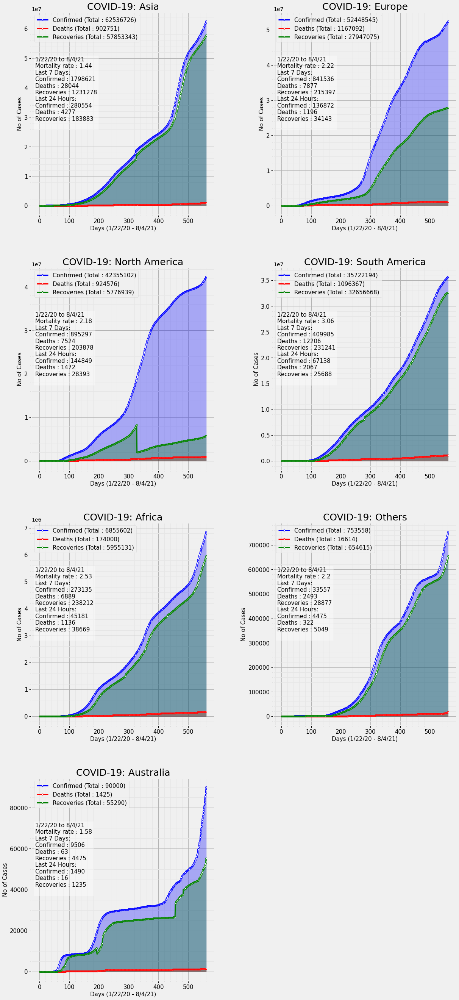

In [36]:
#Nhập code ở đây:
#draw with customize function
################################ PLOTING 7 CONTINENT CHART ################################ 

# Create 7 subplots
figure = plt.figure(figsize=(20,40))
fig1=[figure, 4, 2, 1]
fig2=[figure, 4, 2, 2]
fig3=[figure, 4, 2, 3]
fig4=[figure, 4, 2, 4]
fig5=[figure, 4, 2, 5]
fig6=[figure, 4, 2, 6]
fig7=[figure, 4, 2, 7]

visualize_covid_cases_7(confirmed_df, deaths_df,recoveries_df,
                          continents['AS'] , country = None , state = None, period = None, figure =fig1,
                          scale = "linear")
visualize_covid_cases_7(confirmed_df, deaths_df,recoveries_df,
                          continents['EU'] , country = None , state = None, period = None, figure =fig2,
                          scale = "linear")
visualize_covid_cases_7(confirmed_df, deaths_df,recoveries_df,
                          continents['NA'] , country = None , state = None, period = None, figure =fig3,
                          scale = "linear")
visualize_covid_cases_7(confirmed_df, deaths_df,recoveries_df,
                          continents['SA'] , country = None , state = None, period = None, figure =fig4,
                          scale = "linear")
visualize_covid_cases_7(confirmed_df, deaths_df,recoveries_df,
                          continents['AF'] , country = None , state = None, period = None, figure =fig5,
                          scale = "linear")
visualize_covid_cases_7(confirmed_df, deaths_df,recoveries_df,
                          continents['na'] , country = None , state = None, period = None, figure =fig6,
                          scale = "linear")
visualize_covid_cases_7(confirmed_df, deaths_df,recoveries_df,
                          continents['OC'] , country = None , state = None, period = None, figure =fig7,
                          scale = "linear")

## Bài toán 12
    Trực quan hóa ma trận hiệp phương sai cho continents_df.

<AxesSubplot:>

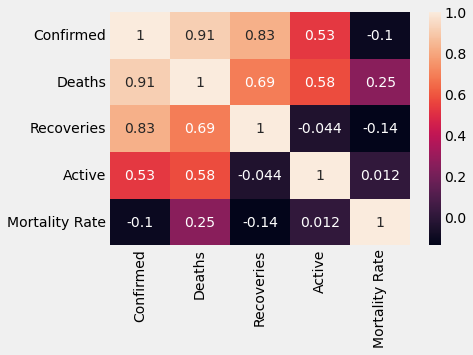

In [37]:
#Nhập code ở đây:
continent_corr = continents_df.corr()
sns.heatmap(continent_corr,annot=True)

## Bài toán 13
    Xây dựng biểu đồ tròn để so sánh tỷ lệ số ca mắc được xác nhận, số ca tử vong, số ca phục hồi và số ca vẫn còn mắc của 7 châu lục.
    Mỗi trường (confirm, deaths, ...) nên được trình bày trong các biểu đồ tròn khác nhau.
    Bạn không được sử dụng đoạn code lặp lại ở đây, hãy thử sử dụng vòng lặp for.
    Mỗi châu lục nên được trình bày bằng các màu sắc khác nhau.

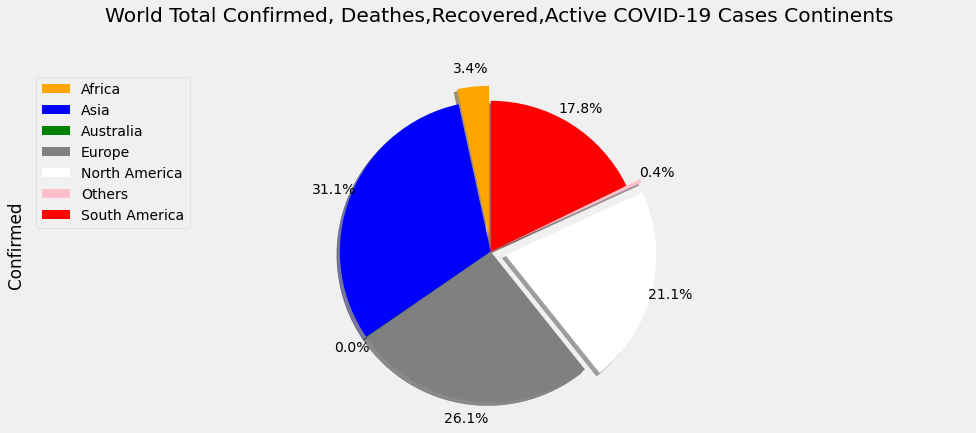

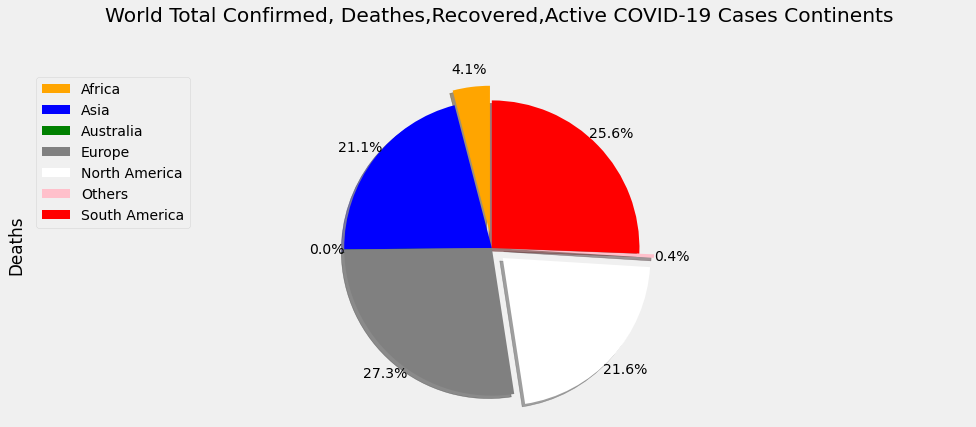

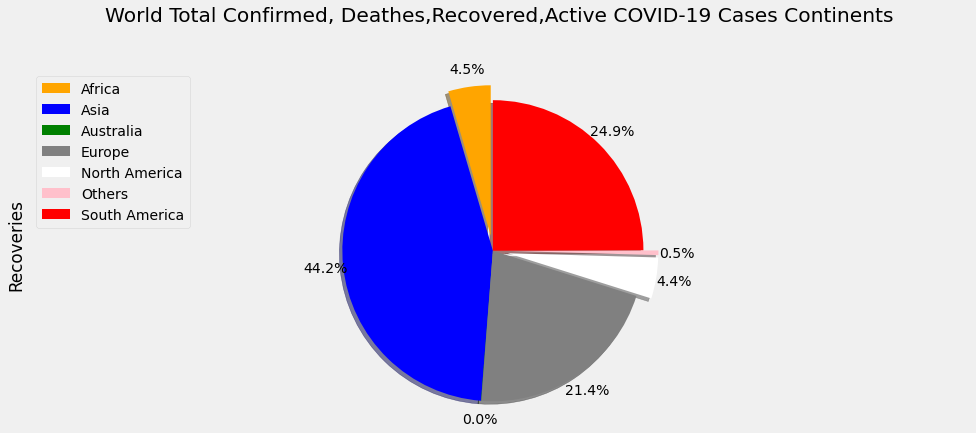

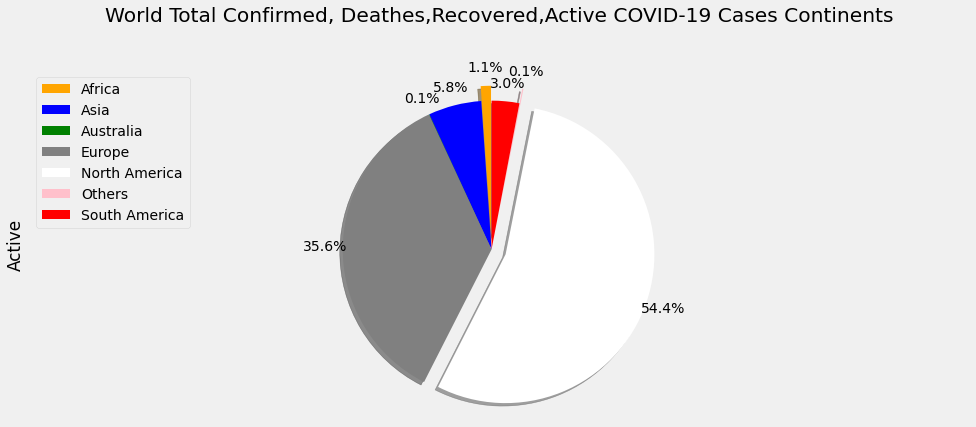

In [38]:
#Nhập code ở đây:
colors_list = ['orange','blue','green','gray','white','pink','red']
columns = ['Confirmed','Deaths','Recoveries','Active']
explode_list = [0.1, 0, 0, 0, 0.1, 0.1,0] # ratio for each continent with which to offset each wedge.
for column in columns:
    f = plt.figure(figsize=(20,40))
    ax = f.add_subplot(111)
    #Ploting the pie chart
    continents_df[column].plot(kind='pie',figsize=(15, 6),colors=colors_list,autopct='%1.1f%%',
                               startangle=90,shadow=True,labels=None,pctdistance=1.12,
                               ax=ax,explode=explode_list)
       #scale the title up by 12% to match pctdistance
    plt.title('World Total Confirmed, Deathes,Recovered,Active COVID-19 Cases Continents', y=1.12) 
    plt.axis('equal') 
    # add legend
    plt.legend(labels=continents_df.index, loc='upper left') 
plt.show()

In [39]:
label = ['Asia', 'Oceania', 'Europe', 'na', 'North America', 'Africa', 'South America']
data_confirmed = continents_df['Confirmed']
data_deaths        = continents_df['Deaths']
data_recoveries    = continents_df['Recoveries']
data_active        = continents_df['Active']

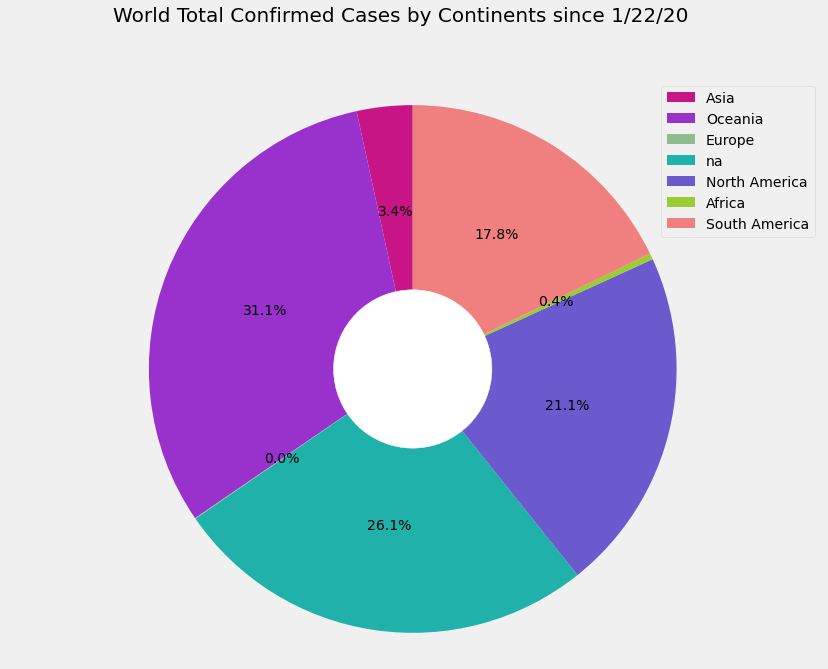

In [40]:
#confirmed
plt.figure(figsize = (13,10))
my_circle = plt.Circle((0, 0), 0.3, color='white')
plt.pie(data_confirmed, autopct='%1.1f%%',startangle=90, colors = ['mediumvioletred', 'darkorchid','darkseagreen','lightseagreen','slateblue','yellowgreen','lightcoral'])
plt.axis('equal')
plt.gca().add_artist(my_circle)
plt.suptitle('World Total Confirmed Cases by Continents since 1/22/20', fontsize = 20)
plt.legend(label)
plt.show()

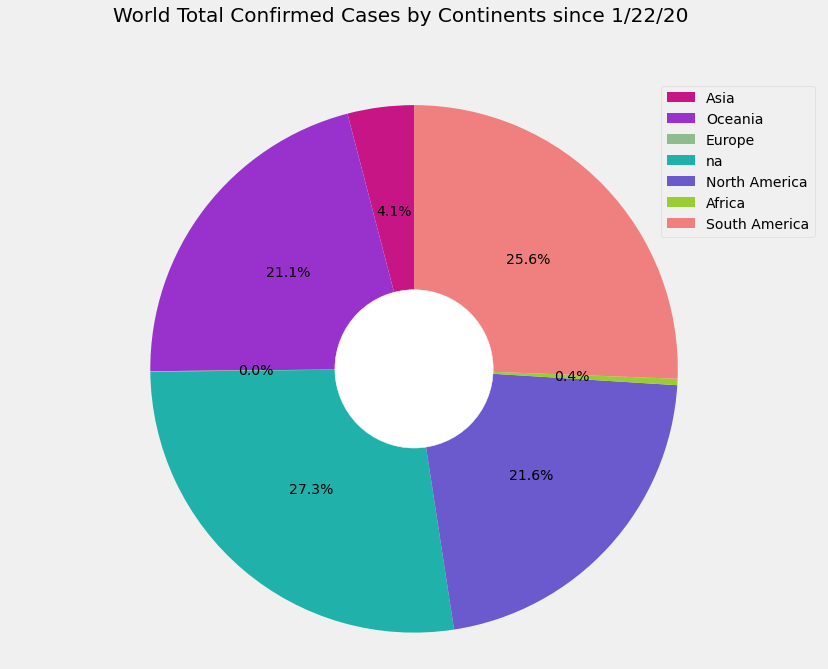

In [41]:
#deaths
plt.figure(figsize = (13,10))
my_circle = plt.Circle((0, 0), 0.3, color='white')
plt.pie(data_deaths, autopct='%1.1f%%',startangle=90, colors = ['mediumvioletred', 'darkorchid','darkseagreen','lightseagreen','slateblue','yellowgreen','lightcoral'])
plt.axis('equal')
plt.gca().add_artist(my_circle)
plt.suptitle('World Total Confirmed Cases by Continents since 1/22/20', fontsize = 20)
plt.legend(label)
plt.show()

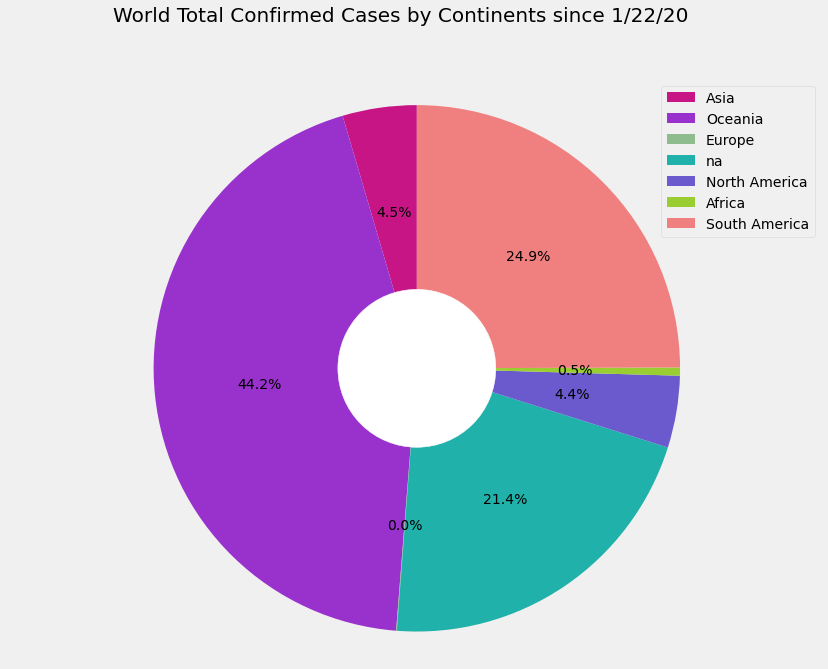

In [42]:
#recovered
plt.figure(figsize = (13,10))
my_circle = plt.Circle((0, 0), 0.3, color='white')
plt.pie(data_recoveries, autopct='%1.1f%%',startangle=90, colors = ['mediumvioletred', 'darkorchid','darkseagreen','lightseagreen','slateblue','yellowgreen','lightcoral'])
plt.axis('equal')
plt.gca().add_artist(my_circle)
plt.suptitle('World Total Confirmed Cases by Continents since 1/22/20', fontsize = 20)
plt.legend(label)
plt.show()

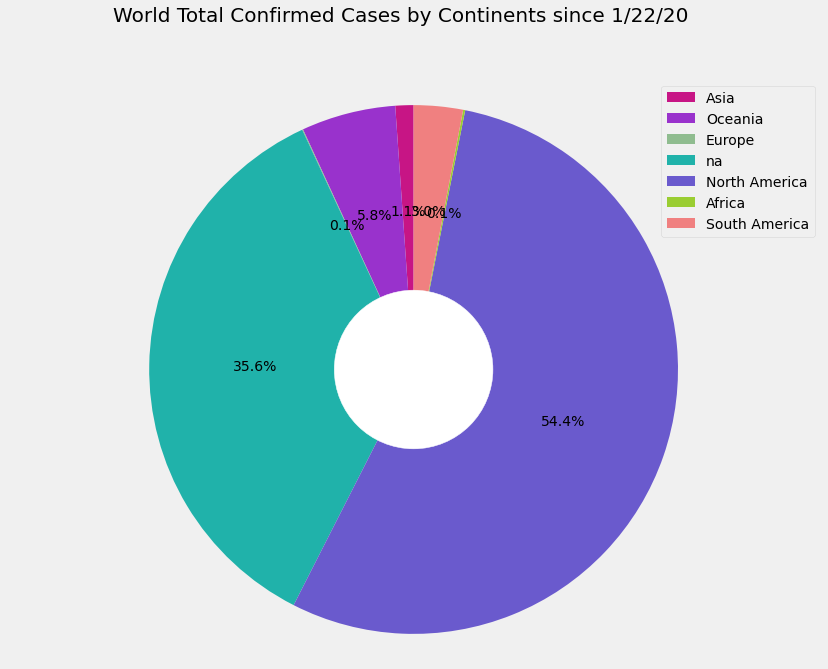

In [43]:
#active
#confirmed
plt.figure(figsize = (13,10))
my_circle = plt.Circle((0, 0), 0.3, color='white')
plt.pie(data_active, autopct='%1.1f%%',startangle=90, colors = ['mediumvioletred', 'darkorchid','darkseagreen','lightseagreen','slateblue','yellowgreen','lightcoral'])
plt.axis('equal')
plt.gca().add_artist(my_circle)
plt.suptitle('World Total Confirmed Cases by Continents since 1/22/20', fontsize = 20)
plt.legend(label)
plt.show()

# 7. Phân tích theo quốc gia

## Bài toán 14
    Xây dựng bản đồ folium để hiển thị số ca được xác nhận, số ca tử vong, số ca phục hồi và tỷ lệ tử vong của mỗi quốc gia dựa trên vị trí của các quốc gia. Bán kính của vòng tròn tỷ lệ thuận với số ca được xác nhận.


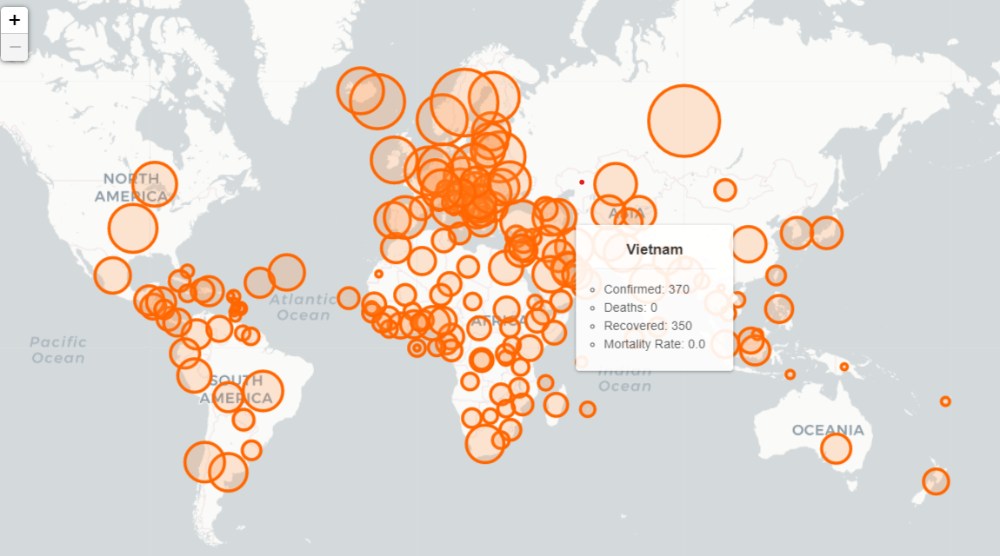

In [44]:
#Nhập code ở đây:
word_map = folium.Map(location=[20,0], tiles="CartoDB Positron", zoom_start=2)

for i in range(len(countries_df)):
    #  get information for each Country 
    country_name = countries_df.index[i]
    latitude = countries_df.iloc[i]['Lat']
    longtitude = countries_df.iloc[i]['Long']
    confirmed = countries_df.iloc[i]['Confirmed']
    deaths = countries_df.iloc[i]['Deaths']
    recoveries = countries_df.iloc[i]['Recoveries']
    mortality_rate = countries_df.iloc[i]['motality_rate']

    
    folium.Circle(
        location=[latitude, longtitude],
        radius=float(confirmed)/100,
        color='#FC7F03',
        fill=True,
       # fill_color='#FC7F03',
       # color="crimson",
        fill_color="#3186cc",
        popup="Covid 19 is so dangerous",
    ).add_to(word_map)

word_map
#Chỉnh size

## Bài toán 15
Xây dựng bản đồ px [(plotly.express)](https://plotly.com/python/plotly-express/) để hiển thị số ca còn mắc Covid của mỗi quốc gia trong log(10) dựa trên tên các quốc gia bằng cách sử dụng màu "quang phổ".

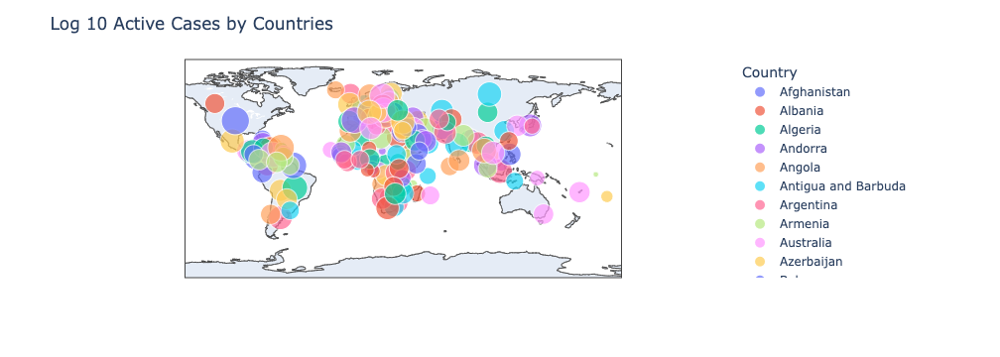

In [45]:
#Nhập code ở đây:
#Insert your code here:
import plotly.express as px


countries_active_cases = countries_df[['Lat', 'Long', 'Active']].copy()

# Remove all 0 value in Active column
countries_active_cases['Active'].replace(0, np.NaN, inplace=True)
countries_active_cases.dropna(inplace=True)

#exchange active to int to call log10 function 
countries_active_cases['Active'].astype('int64')

# Calculate log10 of Countries's Activie Case
countries_active_cases['Log10 Active'] = np.log10(countries_active_cases['Active'])

# Ploting log 10 Active case by countries
fig = px.scatter_geo(countries_active_cases, lat='Lat', lon='Long', color=countries_active_cases.index, 
                     hover_name=countries_active_cases.index, size='Log10 Active')

fig.update_layout(title="Log 10 Active Cases by Countries",
                  legend_title_text='Country')

fig.show()

## Bài toán 16
    Lọc 10 quốc gia hàng đầu dựa trên số ca được xác nhận.

In [54]:
#Nhập code ở đây:
top10_confirmed_countries = countries_df.sort_values(by='Confirmed',ascending=False).head(10)
top10_confirmed_countries

,Lat,Long,continent,Confirmed,Deaths,Recoveries,Active,motality_rate
Country/Region,,,,,,,,
USA,40.000000,-100.000000,North America,35464041,611292,0,34852749,1.72
India,20.593684,78.962880,Asia,31812114,426290,30974748,411076,1.34
Brazil,-14.235000,-51.925300,South America,20034407,559944,17771228,1703235,2.79
Russia,61.524010,105.318756,Europe,6274006,159032,5609682,505292,2.53
France,3.933900,-53.125800,Europe,6272466,112245,415111,5745110,1.79
United Kingdom,18.220600,-63.068600,Europe,5980830,157161,24693,5798976,2.63
Turkey,38.963700,35.243300,Asia,5822487,51767,5478185,292535,0.89
Argentina,-38.416100,-63.616700,South America,4975616,106747,4615834,253035,2.15
Colombia,4.570900,-74.297300,South America,4815063,121695,4615354,78014,2.53


## Bài toán 17
    Trực qua hóa 10 quốc gia được xác nhận hàng đầu với số ca vẫn còn mắc Covid, phục hồi và tử vong bằng cách sử dụng biểu đồ thanh xếp chồng lên nhau.

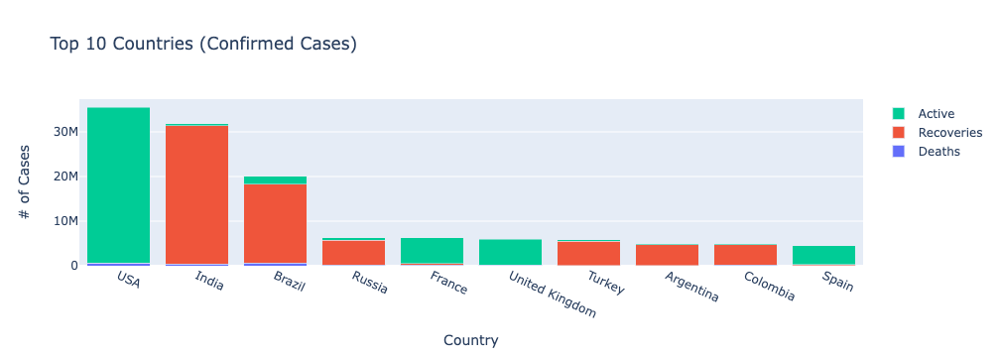

In [77]:
#Nhập code ở đây:

x = top10_confirmed_countries.index
# Create figure
fig = go.Figure()

# Create trace for each categories
trace0 = go.Bar(x=x, y=top10_confirmed_countries['Deaths'], name ='Deaths')
trace1 = go.Bar(x=x, y=top10_confirmed_countries['Recoveries'], name ='Recoveries')
trace2 = go.Bar(x=x, y=top10_confirmed_countries['Active'], name ='Active')

# Adding trace to figure
fig.add_trace(trace0)
fig.add_trace(trace1)
fig.add_trace(trace2)

# Setting layout
fig.update_layout(barmode='stack', 
                  title="Top 10 Countries (Confirmed Cases)",
                  xaxis_title="Country",
                  yaxis_title="# of Cases")
fig.update_xaxes(tickangle=25)

# Show plot
fig.show()

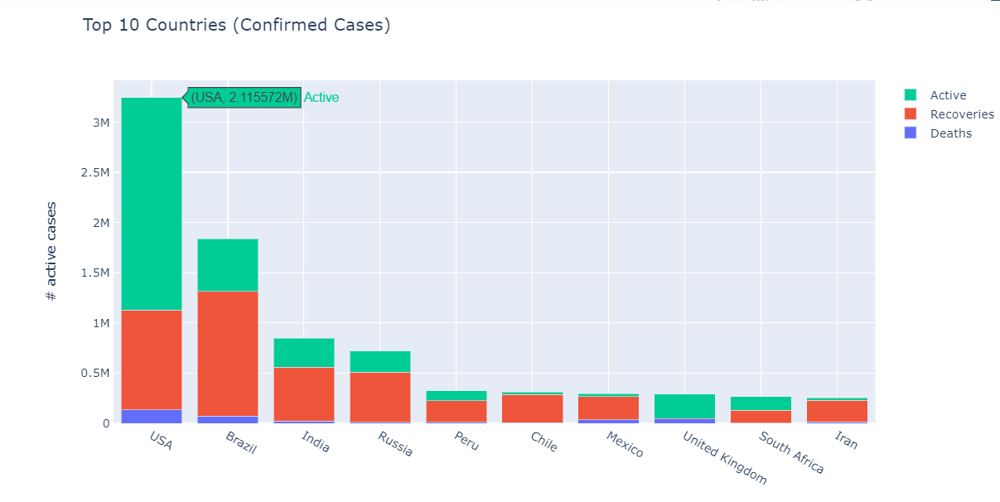

# 8. Phân tích nâng cao
 

## Bài toán 18
    Dựa trên dữ liệu trực quan toàn cầu, đại dịch COVID 2019 trên thế giới đã đạt đến đỉnh điểm chưa?
    Bạn hãy trả lời ở đây:


<b>Trả lời :</b>
 - Dựa vào bài toán 2, nhìn vào biểu đồ đường thì thấy các đường confirmed,deaths,recovered,active đều xu hướng tăng.Cho nên data từ ngày 20/1/2020 vẫn chưa đạt đến đỉnh điểm của dịch.

## Bài toán 19
Dựa trên trực quan hóa dữ liệu của châu lục:

    19.1 Châu lục nào có tỷ lệ tử vong cao nhất theo các ca mắc của châu lục?

    19.2 Châu lục nào có tỷ lệ lây lan COVID 2019 cao nhất theo số ca mắc của châu lục?
    
    19.3 Châu lục nào có tỷ lệ phục hồi cao nhất trong tập dữ liệu của các châu lục?

(Lưu ý: Tỷ lệ lan truyền COVID 2019 = Số lượng các ca mới được xác nhận trong 10 ngày qua / số ca mắc trước đó).
Bạn hãy trả lời ở đây:

In [74]:
continents_df['Death Rate %'] = (continents_df['Deaths']/continents_df['Deaths'].sum()) * 100
continents_df.sort_values(by = 'Death Rate %',ascending=False).head()

,Confirmed,Deaths,Recoveries,Active,Mortality Rate,Death Rate %,Active Rate %,Recovered Rate %
continent,,,,,,,,
Europe,52448545,1167092,27947075,23334378,2.23,27.250518,35.581632,21.350096
South America,35722194,1096367,32656668,1969159,3.07,25.599155,3.002690,24.947977
North America,42355102,924576,5776939,35653587,2.18,21.587994,54.366687,4.413278
Asia,62536726,902751,57853343,3780632,1.44,21.078400,5.764930,44.196912
Africa,6855602,174000,5955131,726471,2.54,4.062739,1.107766,4.549407


### 19.1 Châu lục có tỷ lệ tử vong cao nhất theo số ca mắc châu lục là: $Europe$

In [75]:
continents_df['Active Rate %'] =(continents_df['Active']/continents_df['Active'].sum())*100 
continents_df.sort_values('Active Rate %',ascending =False).head()

,Confirmed,Deaths,Recoveries,Active,Mortality Rate,Death Rate %,Active Rate %,Recovered Rate %
continent,,,,,,,,
North America,42355102,924576,5776939,35653587,2.18,21.587994,54.366687,4.413278
Europe,52448545,1167092,27947075,23334378,2.23,27.250518,35.581632,21.350096
Asia,62536726,902751,57853343,3780632,1.44,21.078400,5.764930,44.196912
South America,35722194,1096367,32656668,1969159,3.07,25.599155,3.002690,24.947977
Africa,6855602,174000,5955131,726471,2.54,4.062739,1.107766,4.549407


### 19.2 North America là châu lục có tỷ lệ lây lan COVID 2019 cao nhất theo số ca mắc của châu lục 

In [76]:
continents_df['Recovered Rate %'] = (continents_df['Recoveries']/continents_df['Recoveries'].sum()) * 100
continents_df.sort_values(by = 'Recovered Rate %',ascending=False).head()

,Confirmed,Deaths,Recoveries,Active,Mortality Rate,Death Rate %,Active Rate %,Recovered Rate %
continent,,,,,,,,
Asia,62536726,902751,57853343,3780632,1.44,21.078400,5.764930,44.196912
South America,35722194,1096367,32656668,1969159,3.07,25.599155,3.002690,24.947977
Europe,52448545,1167092,27947075,23334378,2.23,27.250518,35.581632,21.350096
Africa,6855602,174000,5955131,726471,2.54,4.062739,1.107766,4.549407
North America,42355102,924576,5776939,35653587,2.18,21.587994,54.366687,4.413278


### 19.3 Asia có tỉ lệ phục hồi cao nhất trong tập dữ liệu các châu lục

## Bài toán 20
Dựa trên trực quan hóa dữ liệu theo quốc gia:

    20.1 Quốc gia nào có tỷ lệ tử vong cao nhất theo tập dữ liệu của các quốc gia?

    20.2 Quốc gia nào có tỷ lệ lây lan COVID 2019 cao nhất theo với tập dữ liệu của các quốc gia?
     
    20.3 Quốc gia nào có tỷ lệ hồi phục cao nhất theo tập dữ liệu của các quốc gia?
Bạn hãy trả lời ở đây:
<p><b>Trả lời:</b></p>

 - USA là nước chiếm tỉ lệ tử vong cao nhất trên thế giới.
 - USA là nước có tỷ lệ lây lan COVID 2019 cao nhất theo với tập dữ liệu các quốc gia.
 - India là nước có tỷ lệ hồi phục cao nhất theo tập dữ liệu của các quốc gia.

In [78]:
#the death rate of each country 
countries_df['Death Rate %'] = (countries_df['Deaths']/countries_df['Deaths'].sum()) * 100
#the spread rate of each country 
countries_df['Active Rate %'] = (countries_df['Active']/countries_df['Active'].sum()) * 100
#the recoveries rate of each country 
countries_df['Recoveries Rate %'] = (countries_df['Recoveries']/countries_df['Recoveries'].sum()) * 100

In [83]:
countries_df.sort_values('Death Rate %', ascending = False).head(1)

,Lat,Long,continent,Confirmed,Deaths,Recoveries,Active,motality_rate,Death Rate %,Active Rate %,Recoveries Rate %
Country/Region,,,,,,,,,,,
USA,40.0,-100.0,North America,35464041,611292,0,34852749,1.72,15.010402,53.011736,0.0


In [84]:
countries_df.sort_values('Active Rate %', ascending = False).head(1)

,Lat,Long,continent,Confirmed,Deaths,Recoveries,Active,motality_rate,Death Rate %,Active Rate %,Recoveries Rate %
Country/Region,,,,,,,,,,,
USA,40.0,-100.0,North America,35464041,611292,0,34852749,1.72,15.010402,53.011736,0.0


In [85]:
countries_df.sort_values('Recoveries Rate %', ascending = False).head(1)

,Lat,Long,continent,Confirmed,Deaths,Recoveries,Active,motality_rate,Death Rate %,Active Rate %,Recoveries Rate %
Country/Region,,,,,,,,,,,
India,20.593684,78.96288,Asia,31812114,426290,30974748,411076,1.34,10.467639,0.625255,24.171402


## Bài toán 21
**USA dataset**

In [100]:
us_medical_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/07-06-2020.csv')

In [101]:
us_medical_data.head()

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,...,Total_Test_Results,People_Hospitalized,Case_Fatality_Ratio,UID,ISO3,Testing_Rate,Hospitalization_Rate,Date,People_Tested,Mortality_Rate
0,Alabama,US,2020-07-07 04:34:13,32.3182,-86.9023,44932,1007,22082.0,21843.0,1,...,NaN,2914.0,NaN,84000001.0,USA,13536.486998,6.493159,2020-07-06,663719.0,2.241164
1,Alaska,US,2020-07-07 04:34:13,61.3707,-152.4044,1184,16,548.0,620.0,2,...,NaN,NaN,NaN,84000002.0,USA,16916.662680,NaN,2020-07-06,123753.0,1.351351
2,American Samoa,US,2020-07-07 04:34:13,-14.2710,-170.1320,0,0,NaN,NaN,60,...,NaN,NaN,NaN,16.0,ASM,1250.876152,NaN,2020-07-06,696.0,NaN
3,Arizona,US,2020-07-07 04:34:13,33.7298,-111.4312,101455,1829,11836.0,87790.0,4,...,NaN,5188.0,NaN,84000004.0,USA,8488.322873,5.113597,2020-07-06,873294.0,1.802770
4,Arkansas,US,2020-07-07 04:34:13,34.9697,-92.3731,24253,292,17834.0,6127.0,5,...,NaN,1575.0,NaN,84000005.0,USA,11431.093603,6.494042,2020-07-06,344968.0,1.203975


In [102]:
us_medical_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Province_State        58 non-null     object 
 1   Country_Region        58 non-null     object 
 2   Last_Update           58 non-null     object 
 3   Lat                   56 non-null     float64
 4   Long_                 56 non-null     float64
 5   Confirmed             58 non-null     int64  
 6   Deaths                58 non-null     int64  
 7   Recovered             48 non-null     float64
 8   Active                48 non-null     float64
 9   FIPS                  58 non-null     int64  
 10  Incident_Rate         56 non-null     float64
 11  Total_Test_Results    5 non-null      float64
 12  People_Hospitalized   36 non-null     float64
 13  Case_Fatality_Ratio   0 non-null      float64
 14  UID                   58 non-null     float64
 15  ISO3                  58 

In [108]:
#Nhập code ở đây:
us_medical_data.sort_values(by='Mortality_Rate',ascending=False).head(1)

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,...,People_Hospitalized,Case_Fatality_Ratio,UID,ISO3,Testing_Rate,Hospitalization_Rate,Date,People_Tested,Mortality_Rate,Recoveries Rate %
7,Connecticut,US,2020-07-07 04:34:13,41.5978,-72.7554,46976,4338,8210.0,34428.0,9,...,10411.0,NaN,84000009.0,USA,14707.483577,22.162381,2020-07-06,524364.0,9.234503,0.888386


In [109]:
us_medical_data.sort_values(by='Incident_Rate',ascending=False).head(1)

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,...,People_Hospitalized,Case_Fatality_Ratio,UID,ISO3,Testing_Rate,Hospitalization_Rate,Date,People_Tested,Mortality_Rate,Recoveries Rate %
36,New York,US,2020-07-07 04:34:13,42.1657,-74.9481,397649,32057,71040.0,294552.0,36,...,89995.0,NaN,84000036.0,USA,22042.910293,22.631768,2020-07-06,4288131.0,8.061632,7.68708


In [107]:
#Tính tỷ lệ hồi phục trong tập dư liệu
us_medical_data['Recoveries Rate %'] = (us_medical_data['Recovered']/us_medical_data['Recovered'].sum()) * 100
us_medical_data.sort_values('Recoveries Rate %', ascending = False).head(1)

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,...,People_Hospitalized,Case_Fatality_Ratio,UID,ISO3,Testing_Rate,Hospitalization_Rate,Date,People_Tested,Mortality_Rate,Recoveries Rate %
49,Texas,US,2020-07-07 04:34:13,31.0545,-97.5635,204949,2872,103782.0,97880.0,48,...,NaN,NaN,84000048.0,USA,7462.194372,NaN,2020-07-06,2163729.0,1.404168,11.230019


Dựa trên USA dataset:

    21.1 Tiểu bang nào có tỷ lệ tử vong cao nhất theo tập dữ liệu của các tiểu bang? 'Connecticut'

    21.2 Tiểu bang nào có tỷ lệ lây lan COVID 2019 cao nhất theo tập dữ liệu của các tiểu bang? 'New York'
    
    21.3 Tiểu bang nào có tỷ lệ hồi phục cao nhất theo tập dữ liệu của các tiểu bang? 'Texas'

## Bài toán 22
Xây dựng mô hình hồi quy (hoặc nhiều hơn 1 mô hình) để dự đoán số ca mắc Covid được xác nhận mới ở 10 bang hàng đầu có số ca mắc được xác nhận cao nhất ở Hoa Kỳ.

Coefficient of determination: 0.8090324896533131
Intercept: 52660.29438413144
Slope: [0.05905212]
Regression Equation: y = 0.059052120582181164x + 52660.29438413144


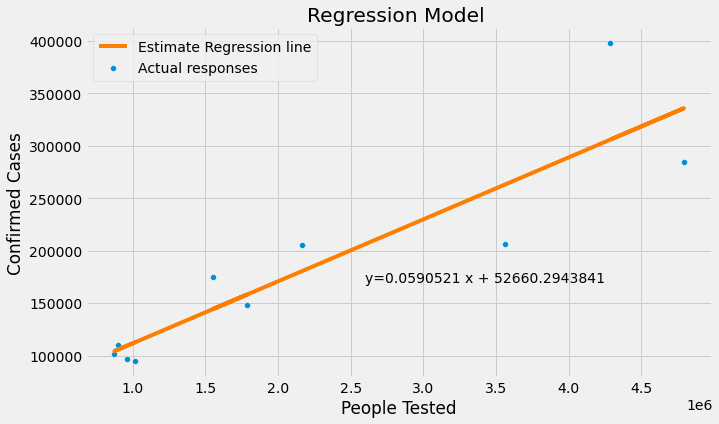

In [110]:
#Nhập code ở đây:
#Insert your code here:
from sklearn.linear_model import LinearRegression

# Top 10 state have highest confirmed
top10_state = us_medical_data.sort_values(by=['Confirmed'], ascending=False).head(10)
# top10_state

# Input data
x = np.asarray(top10_state['People_Tested']).reshape((-1, 1))
y = np.asarray(top10_state['Confirmed'])

# Create a linear regression model
model = LinearRegression(fit_intercept=True)
model.fit(x, y)

# Predict value
xfit = x
yfit = model.predict(xfit)


# Coefficient of determination
r_sq = model.score(x, y)
print('Coefficient of determination:', r_sq)

# Intercept
print('Intercept:', model.intercept_)

# Slope:
print('Slope:', model.coef_)

# Equation
print(f'Regression Equation: y = {model.coef_[0]}x + {model.intercept_}')

# Plot the estimated linear regression line:
fig = plt.figure(figsize=(10,6))                                                                # Create figure

sns.scatterplot(data=top10_state, x='People_Tested', y='Confirmed', label='Actual responses')   # Actual data
plt.plot(xfit, yfit, color='#FC7F03', label="Estimate Regression line")                         # Regresion line

# Regression Equation
plt.annotate('y={0:.7f} x + {1:.7f}'.format(model.coef_[0], model.intercept_), xy=(2600000, 170000))

# Add label
plt.xlabel('People Tested')
plt.ylabel('Confirmed Cases')
plt.title('Regression Model ')
plt.legend()

# Show plot
plt.show()